In [1]:
# 需要准备的预测相关变量：
# 一. 时序类：
# 1.农历日期或农历假日标签，2.当地的天气、平均温度、平均相对湿度，3.促销分类标签，4.陈列位置分类标签，5.除促销外的其他异常事件标签，
# 6.商店人流量，7.单品价格，8.单品销售额，9.采购订单历史记录（采购量、采购额），10.缺货历史记录（数量），
# 11.竞争对手价格、销售额、销量，12.与该单品相似商品的各种历史数据，13.门店营业天数及单品在销天数，14.地区相关门店的其他信息，
# 15.星期（对日序列）、月份、季度，16.距保质期末剩余天数，17.降雨量，18.日照时长、光照量，19.风力及风向，
# 二. 非时序类：
# 1.地区总人口、GDP、GNP、CPI、地区失业率、人均可支配收入等在统计局网站所能获取的经济指标，2.门店位置标签或门店编号、门店类型，
# 3.地区房屋均价、租金，4.单品所属部门类型或编号，5.地区相关门店的其他信息，6.商品相关属性，如生产商、品牌、材料、颜色、形状、尺寸，
# 7.某一时期地区能源价格如电价、油价等，

In [2]:
import time
t0 = time.clock()
import logging
logging.getLogger('fbprophet').setLevel(logging.ERROR)
import warnings
warnings.simplefilter("ignore", DeprecationWarning)
warnings.simplefilter("ignore", FutureWarning)
import pandas as pd
%matplotlib inline
from matplotlib import pyplot as plt
import fbprophet
Prophet = fbprophet.Prophet
from fbprophet.plot import plot_forecast_component

In [3]:
# 导入目标变量及相关变量
data = pd.read_csv('test.csv')
data = data.rename(columns={data.columns[0]:'ds'})
data_train = data[data.index <= data[data.ds == '2017-12-31'].index[0]]
data_test = data[data.index > data[data.ds == '2017-12-31'].index[0]]
data_test.reset_index(drop=True, inplace=True)

temp = pd.read_csv('temp_day.csv', parse_dates=True)
temp = temp.rename(columns={temp.columns[0]:'ds'})
tempt = temp.loc[:,['ds', 'Tmean(C)']]

RH = temp.loc[:,['ds', 'RHmean(%)']]
RH = RH.interpolate(method='linear') # 因为RH中有NaN，进入fit时会报错，所以需填充数值。

rain = pd.read_csv('rain_day.csv', parse_dates=True)
rain = rain.rename(columns={rain.columns[0]:'ds', rain.columns[1]:'rain'})

sun = pd.read_csv('sun_day.csv', parse_dates=True)
sun = sun.rename(columns={sun.columns[0]:'ds', sun.columns[1]:'sun'})

wind = pd.read_csv('wind_day.csv', parse_dates=True)
wind = wind.rename(columns={wind.columns[0]:'ds', wind.columns[2]:'wind'})
wind.drop(columns=[wind.columns[1]], inplace=True)


# 设置自定义节假日
# 'lower_window': -n，表示从“指定日期减n天”开始计算假日分量；upper_window': n，表示假日分量计算到”指定日期加n天“；0表示指定日期当天。
holidays_df = pd.DataFrame({'holiday': 'holidays_df',
                            'ds': pd.to_datetime(['2013-02-14', '2013-03-08', '2013-06-01',
                                                  '2013-09-10', '2013-11-11', '2013-12-12',
                                                  '2014-02-14', '2014-03-08', '2014-06-01',
                                                  '2014-09-10', '2014-11-11', '2014-12-12',
                                                  '2015-02-14', '2015-03-08', '2015-06-01',
                                                  '2015-09-10', '2015-11-11', '2015-12-12',
                                                  '2016-02-14', '2016-03-08', '2016-06-01',
                                                  '2016-09-10', '2016-11-11', '2016-12-12',
                                                  '2017-02-14', '2017-03-08', '2017-06-01',
                                                  '2017-09-10', '2017-11-11', '2017-12-12',
                                                  '2018-02-14', '2018-03-08', '2018-06-01',
                                                  '2018-09-10', '2018-11-11', '2018-12-12', ]),
                            'lower_window': -1,
                            'upper_window': 1})

/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


([801.956270708066,
  1612.209587017619,
  1448.6782414709778,
  526.1420165000064,
  541.9033635973132,
  993.3333640469502,
  1451.0103636337965,
  1566.7721177050826,
  1790.2777826973545,
  1641.1807705332308,
  1722.853583204475,
  1749.567078785501,
  1729.948149760325,
  1703.6660527222766,
  1468.2067334877352,
  1493.8812579322653,
  1159.231310438995,
  884.044657112908,
  1392.1579632558253,
  1734.4921077081926,
  1563.898937551527,
  1132.9305442641826,
  1746.6110327056103,
  1739.4549437106282,
  1516.0490502061023,
  1491.1993114135325,
  1636.5126589107276,
  1807.3517659283434,
  1717.4390573903127,
  1821.1174003217018,
  1511.187215337595,
  485.71505426795056,
  1400.7570002945197,
  1111.386153008546,
  1474.174364272305,
  1326.023854286663,
  1644.3652185632395,
  1595.3988123895163,
  1556.5271693703758,
  1161.9605029317065,
  1218.9442782751196,
  647.8624399616716,
  1527.4795580275486,
  1141.6814008318343,
  1353.9173651147373,
  1742.827189097621,
  1920.

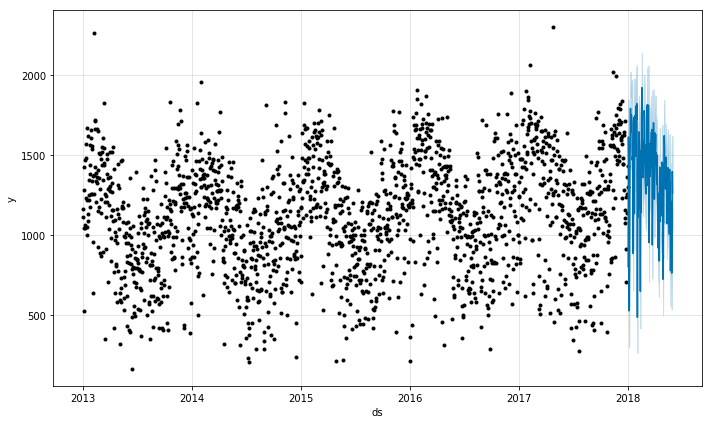

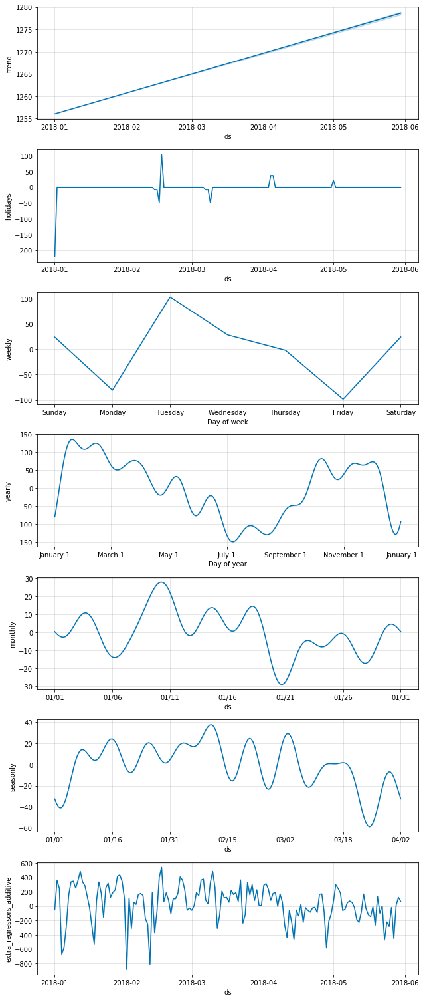

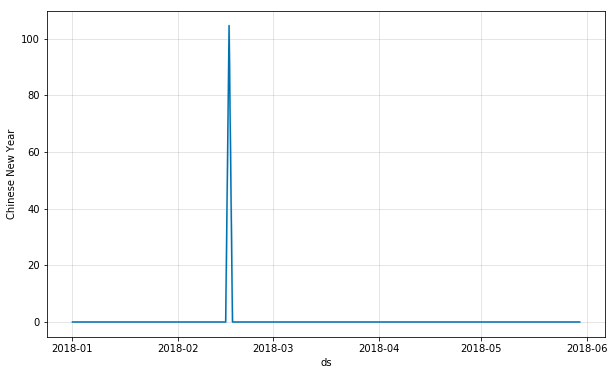

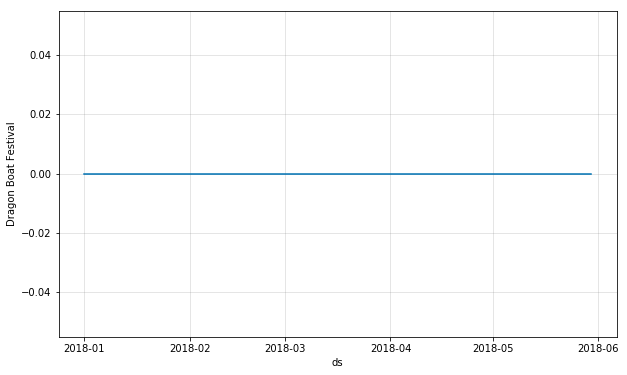

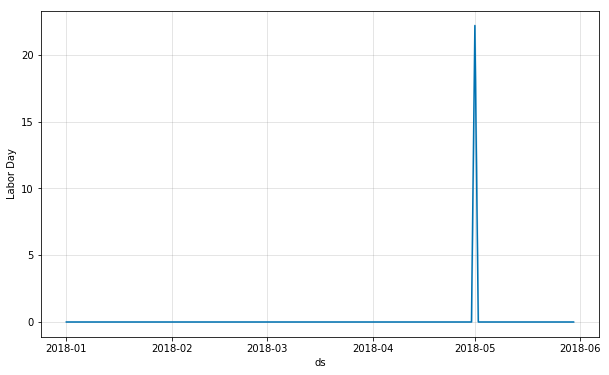

...

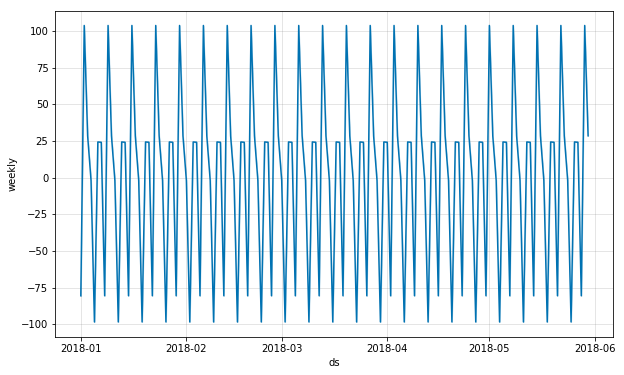

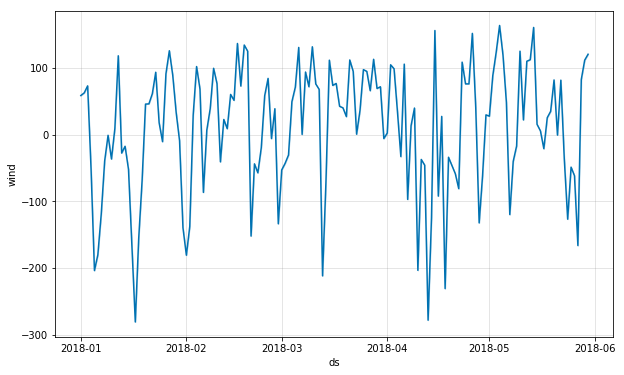

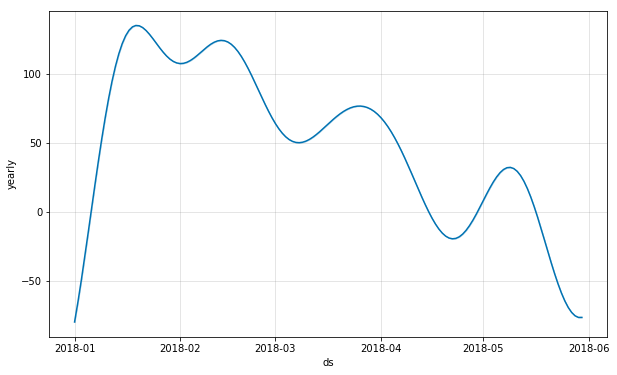

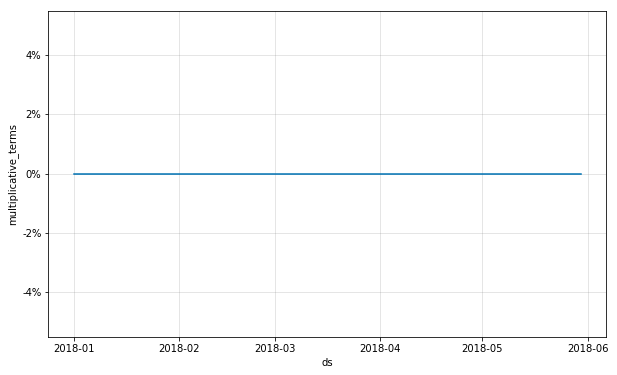

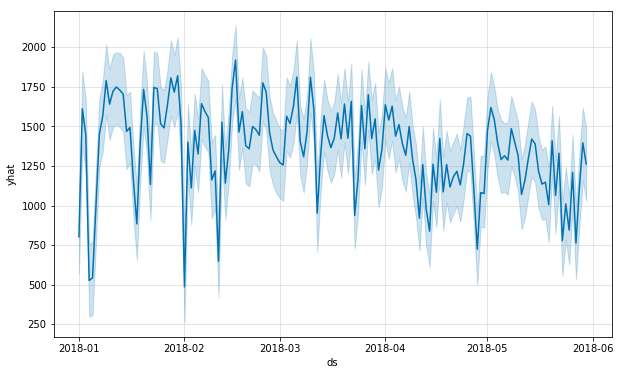

In [4]:
def prophet_func_111(pp_date=data_train['ds'].max(), original_data=data_train, fc=150,
                     relative_data_1=tempt, relative_data_2=RH, relative_data_3=rain,
                     relative_data_4=sun, relative_data_5=wind, holiday=holidays_df):
    '''
    prophet预测,所有非线性项均以加法方式进入模型
    '''

    # 将相关变量切分为训练集和测试集，训练集用在Prophet.fit()中训练模型，测试集用在Prophet.predict()中生成目标变量的预测数据。
    end = str(pd.date_range(start=original_data['ds'].max(), periods=fc+1).max())

    tempt_train = relative_data_1[(relative_data_1['ds'] >= original_data['ds'].min()) & (relative_data_1['ds'] <= pp_date)]
    tempt_test = relative_data_1[(relative_data_1['ds'] > pp_date) & (relative_data_1['ds'] <= end)]
    tempt_train.reset_index(drop=True, inplace=True)
    tempt_test.reset_index(drop=True, inplace=True)

    RH_train = relative_data_2[(relative_data_2['ds'] >= original_data['ds'].min()) & (relative_data_2['ds'] <= pp_date)]
    RH_test = relative_data_2[(relative_data_2['ds'] > pp_date) & (relative_data_2['ds'] <= end)]
    RH_train.reset_index(drop=True, inplace=True)
    RH_test.reset_index(drop=True, inplace=True)

    rain_train = relative_data_3[(relative_data_3['ds'] >= original_data['ds'].min()) & (relative_data_3['ds'] <= pp_date)]
    rain_test = relative_data_3[(relative_data_3['ds'] > pp_date) & (relative_data_3['ds'] <= end)]
    rain_train.reset_index(drop=True, inplace=True)
    rain_test.reset_index(drop=True, inplace=True)

    sun_train = relative_data_4[(relative_data_4['ds'] >= original_data['ds'].min()) & (relative_data_4['ds'] <= pp_date)]
    sun_test = relative_data_4[(relative_data_4['ds'] > pp_date) & (relative_data_4['ds'] <= end)]
    sun_train.reset_index(drop=True, inplace=True)
    sun_test.reset_index(drop=True, inplace=True)

    wind_train = relative_data_5[(relative_data_5['ds'] >= original_data['ds'].min()) & (relative_data_5['ds'] <= pp_date)]
    wind_test = relative_data_5[(relative_data_5['ds'] > pp_date) & (relative_data_5['ds'] <= end)]
    wind_train.reset_index(drop=True, inplace=True)
    wind_test.reset_index(drop=True, inplace=True)

    # 设置模型参数。“1”表示对应项以加法方式进入模型，“2”表示对应项以乘法方式进入模型。
    m111 = Prophet(holidays=holiday, holidays_prior_scale=0.25, changepoint_prior_scale=0.01,
                   seasonality_mode='additive', yearly_seasonality=False, weekly_seasonality=False,
                   daily_seasonality=False)
    # 内置固定及移动节假日
    m111.add_country_holidays(country_name='CN')
    # 设置多重季节性
    m111.add_seasonality(name='yearly', period=365, fourier_order=12, prior_scale=0.1, mode='additive')
    m111.add_seasonality(name='seasonly', period=365/4, fourier_order=10, prior_scale=0.1, mode='additive')
    m111.add_seasonality(name='monthly', period=365/12, fourier_order=8, prior_scale=0.1, mode='additive')
    m111.add_seasonality(name='weekly', period=7, fourier_order=6, prior_scale=0.1, mode='additive')
    # 设置相关变量
    m111.add_regressor(tempt_train.columns[1], prior_scale=0.03, mode='additive')
    m111.add_regressor(RH_train.columns[1], prior_scale=0.03, mode='additive')
    m111.add_regressor(rain_train.columns[1], prior_scale=0.03, mode='additive')
    m111.add_regressor(sun_train.columns[1], prior_scale=0.03, mode='additive')
    m111.add_regressor(wind_train.columns[1], prior_scale=0.03, mode='additive')
    # 拟合及预测数据
    datestamp = pd.date_range(end=pp_date, periods=len(original_data))
    df_train = pd.DataFrame({'ds': datestamp, 'y': original_data['y'],
                             tempt_train.columns[1]: tempt_train[tempt_train.columns[1]],
                             RH_train.columns[1]: RH_train[RH_train.columns[1]],
                             rain_train.columns[1]: rain_train[rain_train.columns[1]],
                             sun_train.columns[1]: sun_train[sun_train.columns[1]],
                             wind_train.columns[1]: wind_train[wind_train.columns[1]],
                             })
    m111.fit(df_train)
    future = m111.make_future_dataframe(periods=fc, freq='1D', include_history=False)
    future111 = pd.concat([future, tempt_test[tempt_test.columns[1]], RH_test[RH_test.columns[1]],
                           rain_test[rain_test.columns[1]], sun_test[sun_test.columns[1]],
                           wind_test[wind_test.columns[1]]], axis=1)
    forecast111 = m111.predict(future111)
    # 输出图形及数值预测结果
    fig1 = m111.plot(forecast111)
    fig2 = m111.plot_components(forecast111)
    for i in range(6, 70, 3):
        plot_forecast_component(m111, forecast111, forecast111.columns[i])

    prophet_amou = forecast111['yhat'].values
    trend_amou = forecast111['trend'].values
    holiday_amou = forecast111['holidays'].values
    seasonality_amou = forecast111['yearly'].values + forecast111['seasonly'].values\
    + forecast111['monthly'].values + forecast111['weekly'].values
    relative_amou = forecast111['extra_regressors_additive'].values
    
    if False not in (prophet_amou - trend_amou - holiday_amou - seasonality_amou - relative_amou < 1e-10):
        prophet_amou_1 = prophet_amou
        trend_amou_1 = trend_amou
        holiday_amou_1 = holiday_amou
        seasonality_amou_1 = seasonality_amou
        relative_amou_1 = relative_amou    
        prophet_amou_1 = [0 if i < 0 else i for i in prophet_amou_1] # 只有prophet_amou_1的负值预测需用0代替，其余不能。
        return prophet_amou_1, trend_amou_1, holiday_amou_1, seasonality_amou_1, relative_amou_1
    else: 
        return None

predict_result = []
predict_result = prophet_func_111()
predict_result


/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


([826.9985986914875,
  1649.6237276815323,
  1471.6838198609007,
  446.05772550290044,
  467.8641792985209,
  963.0860916106743,
  1475.5020013869425,
  1606.2489274868487,
  1857.216817558704,
  1691.242940519083,
  1780.471559192325,
  1807.0653773049646,
  1780.8547845194234,
  1752.812567488639,
  1493.2390176650792,
  1529.545348058222,
  1160.105209685787,
  854.3372378077822,
  1421.851558621578,
  1798.1552401906965,
  1610.246070099555,
  1131.9619500517424,
  1819.4693009473024,
  1815.3818168871003,
  1564.9122108090082,
  1535.026691304343,
  1692.374272979804,
  1886.8311831422202,
  1786.2930021816962,
  1901.848319332829,
  1556.1375708233213,
  410.0640457065832,
  1439.8698196692621,
  1109.7559249555072,
  1513.8699624589003,
  1345.8547281417564,
  1705.631534250926,
  1650.9129666687843,
  1610.9180154532642,
  1171.8329843261372,
  1227.432850350935,
  587.6699619561136,
  1571.7260130316133,
  1129.1671692135742,
  1374.3114274088086,
  1811.312755235048,
  1978.6

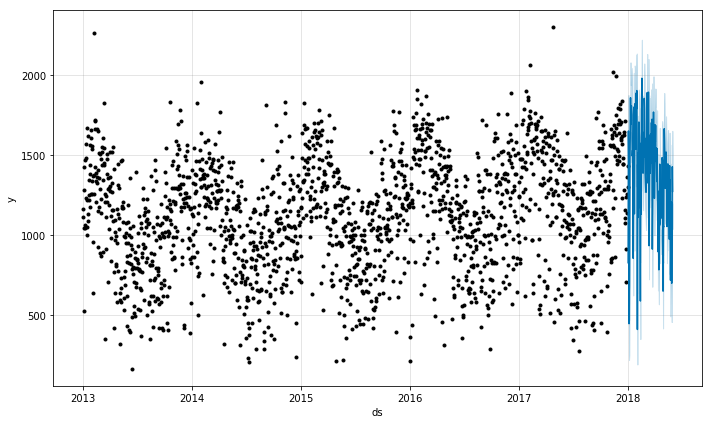

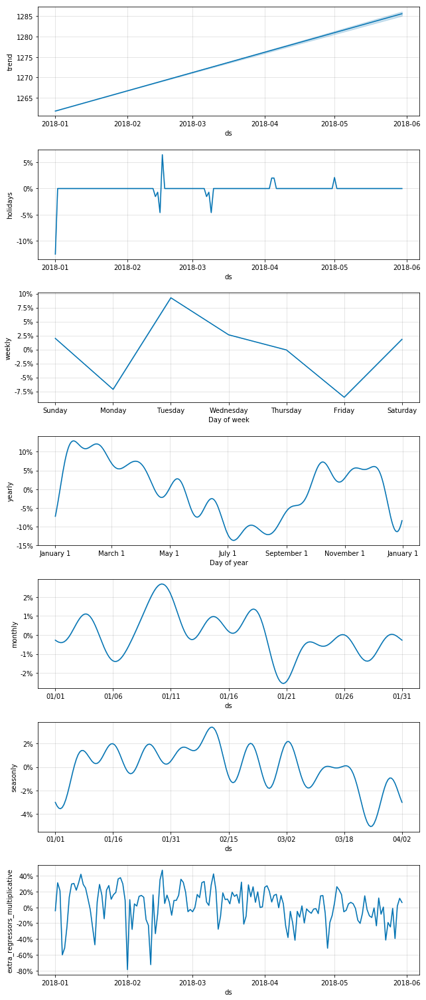

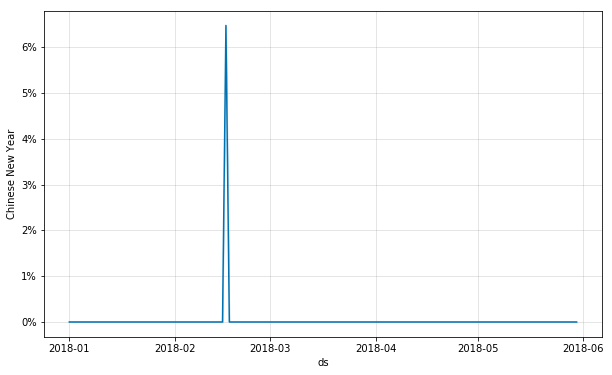

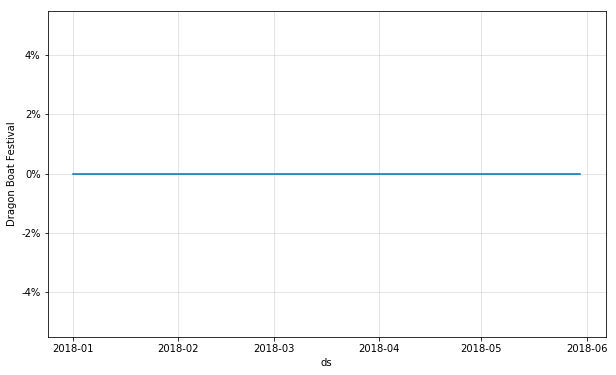

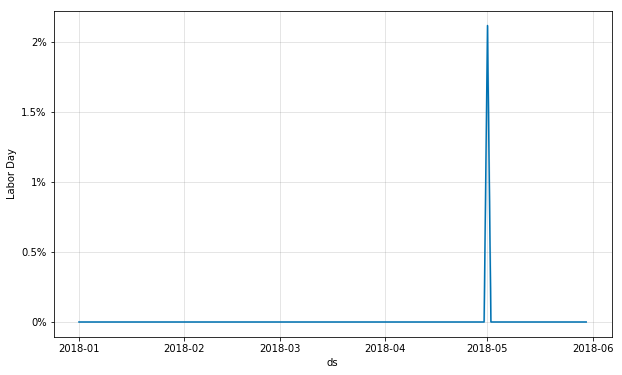

...

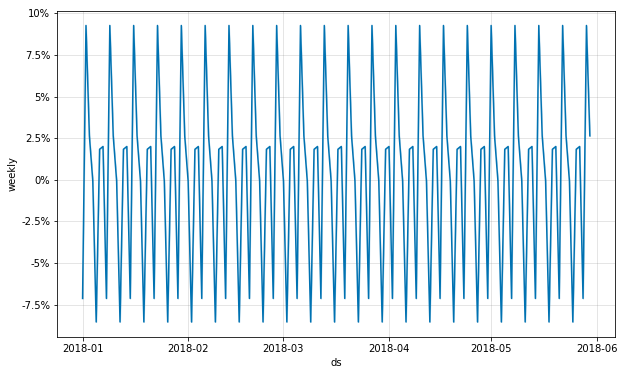

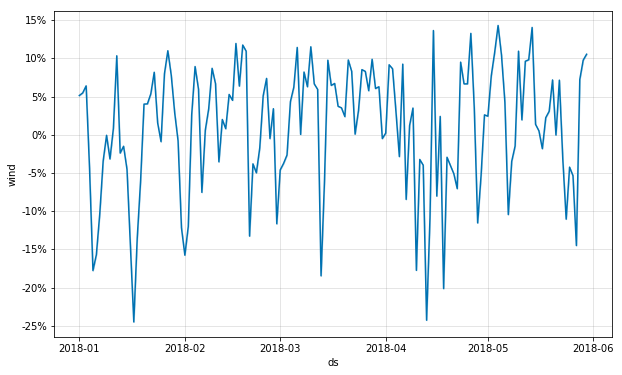

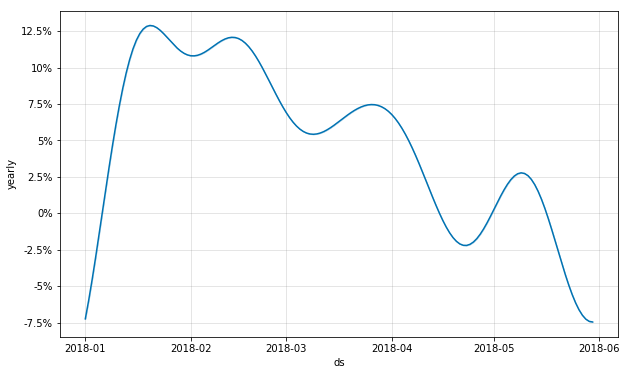

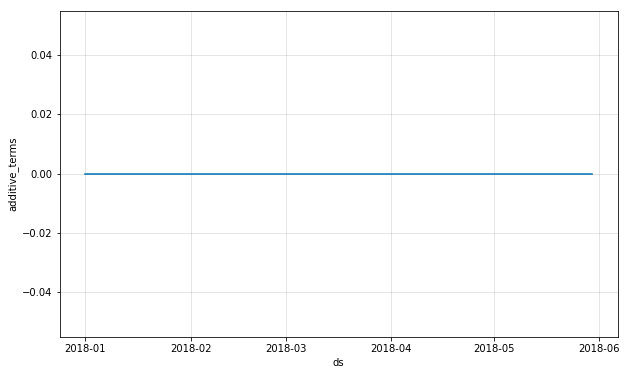

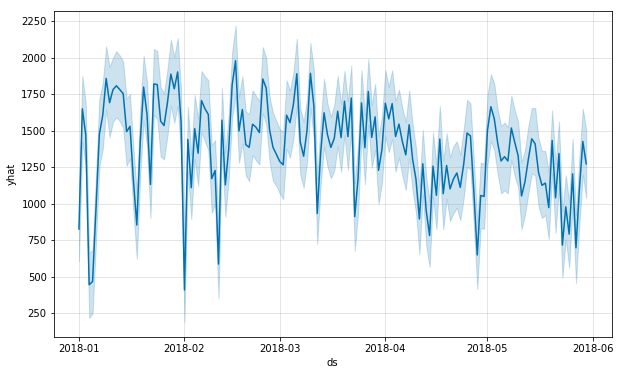

In [5]:
def prophet_func_222(pp_date=data_train['ds'].max(), original_data=data_train, fc=150,
                     relative_data_1=tempt, relative_data_2=RH, relative_data_3=rain,
                     relative_data_4=sun, relative_data_5=wind, holiday=holidays_df):
    '''
    prophet预测,所有非线性项均以乘法方式进入模型
    '''

    # 将相关变量切分为训练集和测试集，训练集用在Prophet.fit()中训练模型，测试集用在Prophet.predict()中生成目标变量的预测数据。
    end = str(pd.date_range(start=original_data['ds'].max(), periods=fc + 1).max())

    tempt_train = relative_data_1[
        (relative_data_1['ds'] >= original_data['ds'].min()) & (relative_data_1['ds'] <= pp_date)]
    tempt_test = relative_data_1[(relative_data_1['ds'] > pp_date) & (relative_data_1['ds'] <= end)]
    tempt_train.reset_index(drop=True, inplace=True)
    tempt_test.reset_index(drop=True, inplace=True)

    RH_train = relative_data_2[
        (relative_data_2['ds'] >= original_data['ds'].min()) & (relative_data_2['ds'] <= pp_date)]
    RH_test = relative_data_2[(relative_data_2['ds'] > pp_date) & (relative_data_2['ds'] <= end)]
    RH_train.reset_index(drop=True, inplace=True)
    RH_test.reset_index(drop=True, inplace=True)

    rain_train = relative_data_3[
        (relative_data_3['ds'] >= original_data['ds'].min()) & (relative_data_3['ds'] <= pp_date)]
    rain_test = relative_data_3[(relative_data_3['ds'] > pp_date) & (relative_data_3['ds'] <= end)]
    rain_train.reset_index(drop=True, inplace=True)
    rain_test.reset_index(drop=True, inplace=True)

    sun_train = relative_data_4[
        (relative_data_4['ds'] >= original_data['ds'].min()) & (relative_data_4['ds'] <= pp_date)]
    sun_test = relative_data_4[(relative_data_4['ds'] > pp_date) & (relative_data_4['ds'] <= end)]
    sun_train.reset_index(drop=True, inplace=True)
    sun_test.reset_index(drop=True, inplace=True)

    wind_train = relative_data_5[
        (relative_data_5['ds'] >= original_data['ds'].min()) & (relative_data_5['ds'] <= pp_date)]
    wind_test = relative_data_5[(relative_data_5['ds'] > pp_date) & (relative_data_5['ds'] <= end)]
    wind_train.reset_index(drop=True, inplace=True)
    wind_test.reset_index(drop=True, inplace=True)

    # 设置模型参数。“1”表示对应项以加法方式进入模型，“2”表示对应项以乘法方式进入模型。
    m222 = Prophet(holidays=holiday, holidays_prior_scale=0.25, changepoint_prior_scale=0.01,
                   seasonality_mode='multiplicative', yearly_seasonality=False, weekly_seasonality=False,
                   daily_seasonality=False)
    # 内置固定及移动节假日
    m222.add_country_holidays(country_name='CN')
    # 设置多重季节性
    m222.add_seasonality(name='yearly', period=365, fourier_order=12, prior_scale=0.1, mode='multiplicative')
    m222.add_seasonality(name='seasonly', period=365 / 4, fourier_order=10, prior_scale=0.1, mode='multiplicative')
    m222.add_seasonality(name='monthly', period=365 / 12, fourier_order=8, prior_scale=0.1, mode='multiplicative')
    m222.add_seasonality(name='weekly', period=7, fourier_order=6, prior_scale=0.1, mode='multiplicative')
    # 设置相关变量
    m222.add_regressor(tempt_train.columns[1], prior_scale=0.03, mode='multiplicative')
    m222.add_regressor(RH_train.columns[1], prior_scale=0.03, mode='multiplicative')
    m222.add_regressor(rain_train.columns[1], prior_scale=0.03, mode='multiplicative')
    m222.add_regressor(sun_train.columns[1], prior_scale=0.03, mode='multiplicative')
    m222.add_regressor(wind_train.columns[1], prior_scale=0.03, mode='multiplicative')
    # 拟合及预测数据
    datestamp = pd.date_range(end=pp_date, periods=len(original_data))
    df_train = pd.DataFrame({'ds': datestamp, 'y': original_data['y'],
                             tempt_train.columns[1]: tempt_train[tempt_train.columns[1]],
                             RH_train.columns[1]: RH_train[RH_train.columns[1]],
                             rain_train.columns[1]: rain_train[rain_train.columns[1]],
                             sun_train.columns[1]: sun_train[sun_train.columns[1]],
                             wind_train.columns[1]: wind_train[wind_train.columns[1]],
                             })
    m222.fit(df_train)
    future = m222.make_future_dataframe(periods=fc, freq='1D', include_history=False)
    future222 = pd.concat([future, tempt_test[tempt_test.columns[1]], RH_test[RH_test.columns[1]],
                           rain_test[rain_test.columns[1]], sun_test[sun_test.columns[1]],
                           wind_test[wind_test.columns[1]]], axis=1)
    forecast222 = m222.predict(future222)
    # 输出图形及数值预测结果
    fig1 = m222.plot(forecast222)
    fig2 = m222.plot_components(forecast222)
    for i in range(6, 70, 3):
        plot_forecast_component(m222, forecast222, forecast222.columns[i])

    prophet_amou = forecast222['yhat'].values
    trend_amou = forecast222['trend'].values
    holiday_amou = forecast222['holidays'].values
    seasonality_amou = forecast222['yearly'].values + forecast222['seasonly'].values \
                       + forecast222['monthly'].values + forecast222['weekly'].values
    relative_amou = forecast222['extra_regressors_multiplicative'].values

    if False not in (prophet_amou - (trend_amou * (1 + holiday_amou + seasonality_amou + relative_amou)) < 1e-10):
        prophet_amou_1 = prophet_amou
        trend_amou_1 = trend_amou
        holiday_amou_1 = holiday_amou
        seasonality_amou_1 = seasonality_amou
        relative_amou_1 = relative_amou
        prophet_amou_1 = [0 if i < 0 else i for i in prophet_amou_1]  # 只有prophet_amou_1的负值预测需用0代替，其余不能。
        return prophet_amou_1, trend_amou_1, holiday_amou_1, seasonality_amou_1, relative_amou_1
    else:
        return None
    
predict_result = []
predict_result = prophet_func_222()
predict_result


/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


([811.6762681679509,
  1653.7866001865189,
  1479.3041629545057,
  451.58366238043936,
  480.903294696721,
  965.5670255581949,
  1470.1959285301295,
  1608.5485119133114,
  1833.9956894864752,
  1675.1219179596847,
  1765.1875694268315,
  1805.2408215619919,
  1768.0331848493827,
  1733.465778248727,
  1481.4669175181612,
  1493.6823911748086,
  1133.9434267970673,
  825.9249079754674,
  1405.2662774762662,
  1777.1204788179998,
  1589.4182571421716,
  1118.5889567957831,
  1779.4330736357736,
  1782.4903435103147,
  1536.6507995061497,
  1519.6800470100611,
  1668.243283561811,
  1861.2317803381964,
  1772.39339375881,
  1865.6723427627558,
  1530.9342210152772,
  384.06100546230226,
  1420.6040288513416,
  1079.9450863061754,
  1486.8692559457534,
  1331.3793503654165,
  1667.862912835184,
  1623.4847432837728,
  1585.1850092160148,
  1150.1375467168982,
  1192.4322249909042,
  550.1556978212341,
  1547.755207643284,
  1095.17785887943,
  1344.9333094116164,
  1811.425781605503,
  1

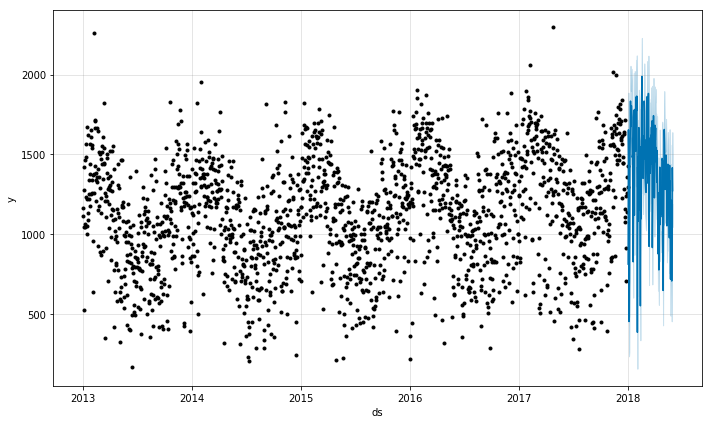

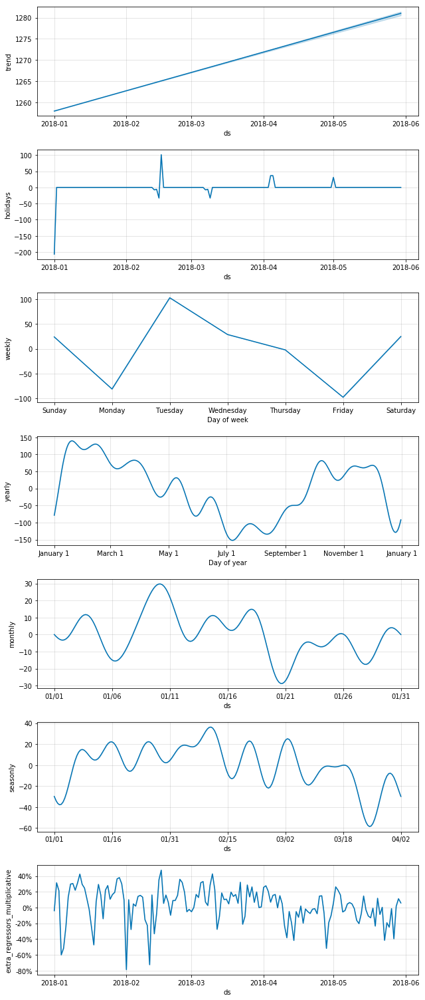

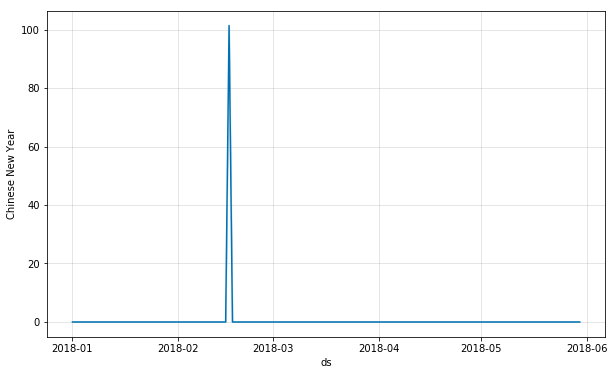

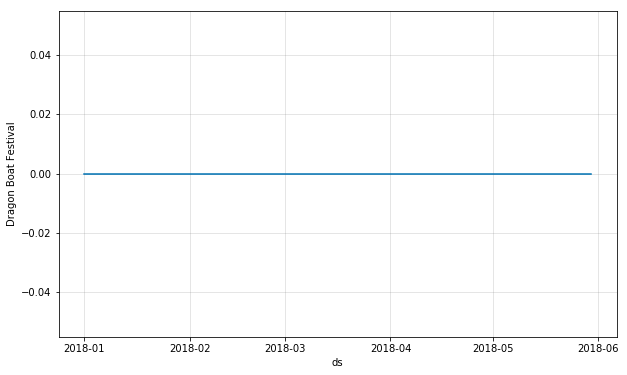

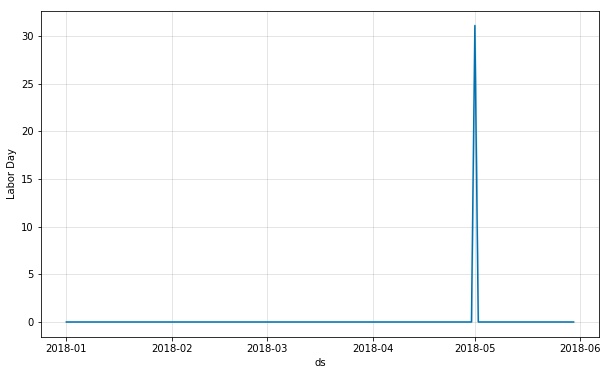

...

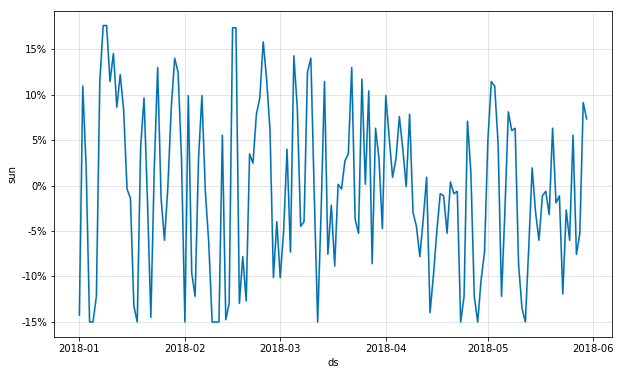

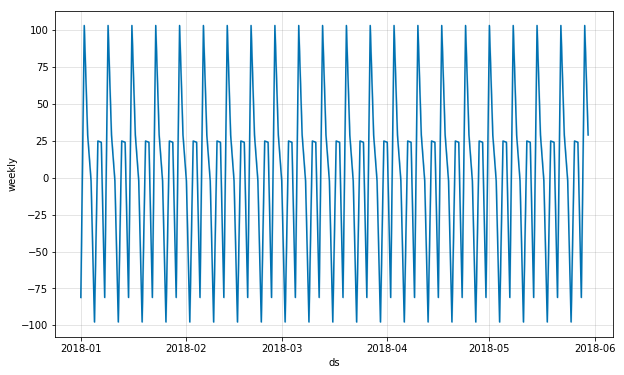

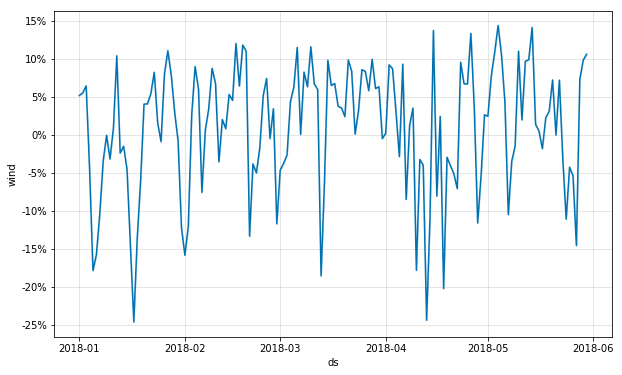

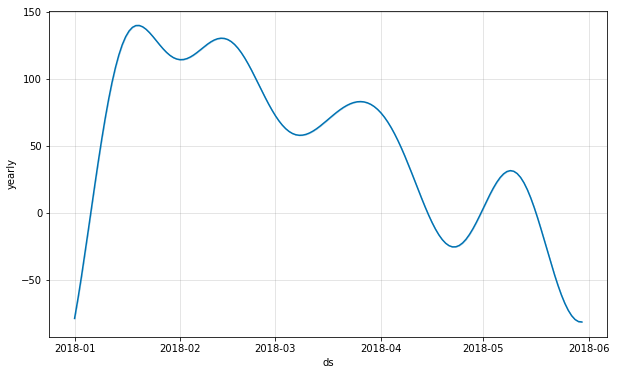

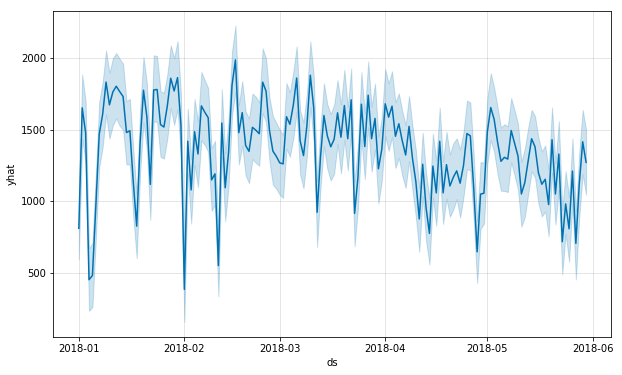

In [6]:
def prophet_func_112(pp_date=data_train['ds'].max(), original_data=data_train, fc=150,
                     relative_data_1=tempt, relative_data_2=RH, relative_data_3=rain,
                     relative_data_4=sun, relative_data_5=wind, holiday=holidays_df):
    '''
    prophet预测，节假日项、季节项以加法方式进入模型，相关变量以乘法方式进入模型。
    '''

    # 将相关变量切分为训练集和测试集，训练集用在Prophet.fit()中训练模型，测试集用在Prophet.predict()中生成目标变量的预测数据。
    end = str(pd.date_range(start=original_data['ds'].max(), periods=fc + 1).max())

    tempt_train = relative_data_1[
        (relative_data_1['ds'] >= original_data['ds'].min()) & (relative_data_1['ds'] <= pp_date)]
    tempt_test = relative_data_1[(relative_data_1['ds'] > pp_date) & (relative_data_1['ds'] <= end)]
    tempt_train.reset_index(drop=True, inplace=True)
    tempt_test.reset_index(drop=True, inplace=True)

    RH_train = relative_data_2[
        (relative_data_2['ds'] >= original_data['ds'].min()) & (relative_data_2['ds'] <= pp_date)]
    RH_test = relative_data_2[(relative_data_2['ds'] > pp_date) & (relative_data_2['ds'] <= end)]
    RH_train.reset_index(drop=True, inplace=True)
    RH_test.reset_index(drop=True, inplace=True)

    rain_train = relative_data_3[
        (relative_data_3['ds'] >= original_data['ds'].min()) & (relative_data_3['ds'] <= pp_date)]
    rain_test = relative_data_3[(relative_data_3['ds'] > pp_date) & (relative_data_3['ds'] <= end)]
    rain_train.reset_index(drop=True, inplace=True)
    rain_test.reset_index(drop=True, inplace=True)

    sun_train = relative_data_4[
        (relative_data_4['ds'] >= original_data['ds'].min()) & (relative_data_4['ds'] <= pp_date)]
    sun_test = relative_data_4[(relative_data_4['ds'] > pp_date) & (relative_data_4['ds'] <= end)]
    sun_train.reset_index(drop=True, inplace=True)
    sun_test.reset_index(drop=True, inplace=True)

    wind_train = relative_data_5[
        (relative_data_5['ds'] >= original_data['ds'].min()) & (relative_data_5['ds'] <= pp_date)]
    wind_test = relative_data_5[(relative_data_5['ds'] > pp_date) & (relative_data_5['ds'] <= end)]
    wind_train.reset_index(drop=True, inplace=True)
    wind_test.reset_index(drop=True, inplace=True)

    # 设置模型参数。“1”表示对应项以加法方式进入模型，“2”表示对应项以乘法方式进入模型。
    m112 = Prophet(holidays=holiday, holidays_prior_scale=0.25, changepoint_prior_scale=0.01,
                   seasonality_mode='additive', yearly_seasonality=False, weekly_seasonality=False,
                   daily_seasonality=False)
    # 内置固定及移动节假日
    m112.add_country_holidays(country_name='CN')
    # 设置多重季节性
    m112.add_seasonality(name='yearly', period=365, fourier_order=12, prior_scale=0.1, mode='additive')
    m112.add_seasonality(name='seasonly', period=365 / 4, fourier_order=10, prior_scale=0.1, mode='additive')
    m112.add_seasonality(name='monthly', period=365 / 12, fourier_order=8, prior_scale=0.1, mode='additive')
    m112.add_seasonality(name='weekly', period=7, fourier_order=6, prior_scale=0.1, mode='additive')
    # 设置相关变量
    m112.add_regressor(tempt_train.columns[1], prior_scale=0.03, mode='multiplicative')
    m112.add_regressor(RH_train.columns[1], prior_scale=0.03, mode='multiplicative')
    m112.add_regressor(rain_train.columns[1], prior_scale=0.03, mode='multiplicative')
    m112.add_regressor(sun_train.columns[1], prior_scale=0.03, mode='multiplicative')
    m112.add_regressor(wind_train.columns[1], prior_scale=0.03, mode='multiplicative')
    # 拟合及预测数据
    datestamp = pd.date_range(end=pp_date, periods=len(original_data))
    df_train = pd.DataFrame({'ds': datestamp, 'y': original_data['y'],
                             tempt_train.columns[1]: tempt_train[tempt_train.columns[1]],
                             RH_train.columns[1]: RH_train[RH_train.columns[1]],
                             rain_train.columns[1]: rain_train[rain_train.columns[1]],
                             sun_train.columns[1]: sun_train[sun_train.columns[1]],
                             wind_train.columns[1]: wind_train[wind_train.columns[1]],
                             })
    m112.fit(df_train)
    future = m112.make_future_dataframe(periods=fc, freq='1D', include_history=False)
    future112 = pd.concat([future, tempt_test[tempt_test.columns[1]], RH_test[RH_test.columns[1]],
                           rain_test[rain_test.columns[1]], sun_test[sun_test.columns[1]],
                           wind_test[wind_test.columns[1]]], axis=1)
    forecast112 = m112.predict(future112)
    # 输出图形及数值预测结果
    fig1 = m112.plot(forecast112)
    fig2 = m112.plot_components(forecast112)
    for i in range(6, 70, 3):
        plot_forecast_component(m112, forecast112, forecast112.columns[i])

    prophet_amou = forecast112['yhat'].values
    trend_amou = forecast112['trend'].values
    holiday_amou = forecast112['holidays'].values
    seasonality_amou = forecast112['yearly'].values + forecast112['seasonly'].values \
                       + forecast112['monthly'].values + forecast112['weekly'].values
    relative_amou = forecast112['extra_regressors_multiplicative'].values

    if False not in (prophet_amou - (trend_amou * (1+relative_amou) + holiday_amou + seasonality_amou) < 1e-10):
        prophet_amou_1 = prophet_amou
        trend_amou_1 = trend_amou
        holiday_amou_1 = holiday_amou
        seasonality_amou_1 = seasonality_amou
        relative_amou_1 = relative_amou
        prophet_amou_1 = [0 if i < 0 else i for i in prophet_amou_1]  # 只有prophet_amou_1的负值预测需用0代替，其余不能。
        return prophet_amou_1, trend_amou_1, holiday_amou_1, seasonality_amou_1, relative_amou_1
    else:
        return None
    
predict_result = []
predict_result = prophet_func_112()
predict_result


/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


([784.7037829565606,
  1612.6484232710852,
  1442.2331350576878,
  521.7430654247211,
  525.6305461346572,
  988.612415121788,
  1454.8190668679197,
  1565.187148865823,
  1814.2157218283326,
  1655.695902043046,
  1737.607592210069,
  1754.0029279692424,
  1743.6663936403484,
  1721.64904067346,
  1477.910503609014,
  1527.4011145182787,
  1181.9761591067593,
  904.9968885802061,
  1402.311917102762,
  1751.1742656058182,
  1580.9127889211954,
  1140.3626559643826,
  1782.1509586848076,
  1765.0454171211245,
  1539.0741570473172,
  1502.5814837439145,
  1656.9664222434224,
  1829.671709555137,
  1729.0160380932905,
  1855.7495174919081,
  1533.4566140782536,
  506.72768522212687,
  1410.5981498127792,
  1131.121110470379,
  1495.0953232276322,
  1335.1823890972537,
  1676.913644527649,
  1617.5430064020175,
  1576.0859807691238,
  1168.939891800627,
  1239.4087776069518,
  675.635849652828,
  1543.282424375878,
  1176.8522211810675,
  1372.1112294728339,
  1765.4913477325788,
  1917.9

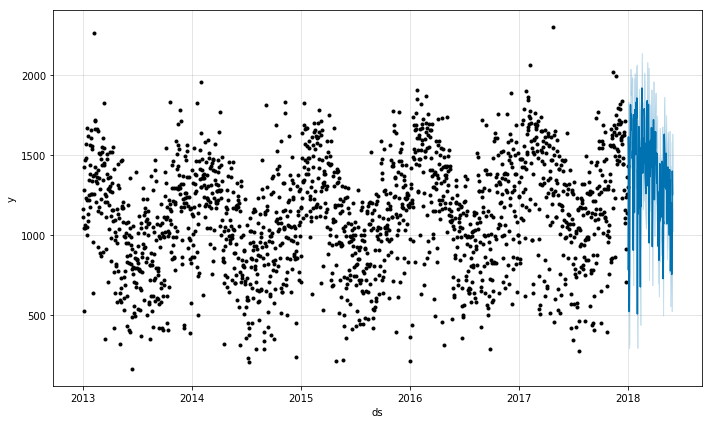

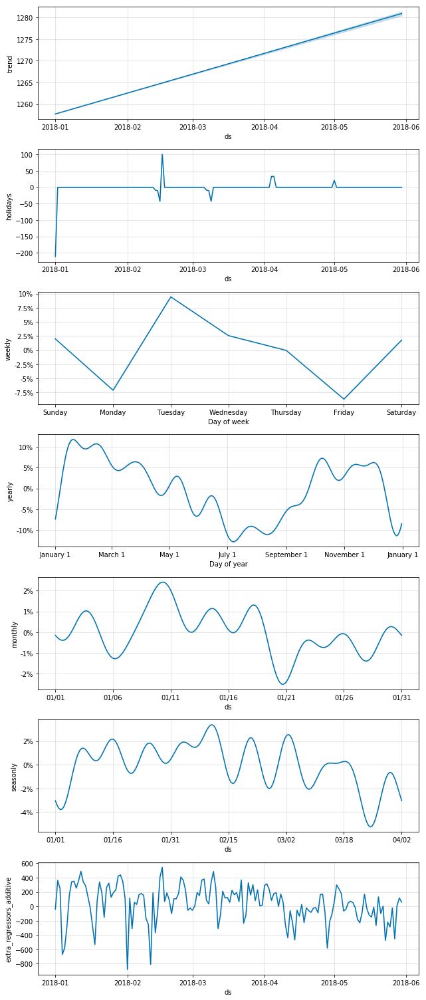

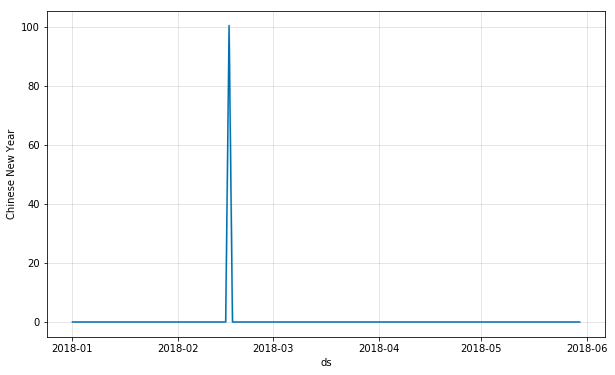

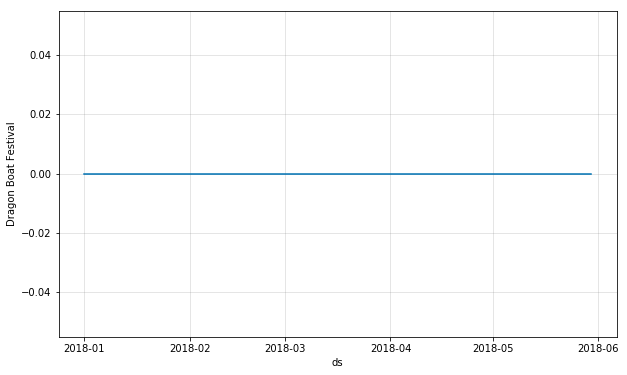

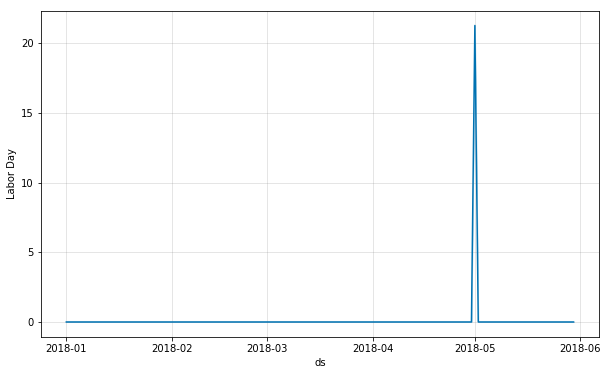

...

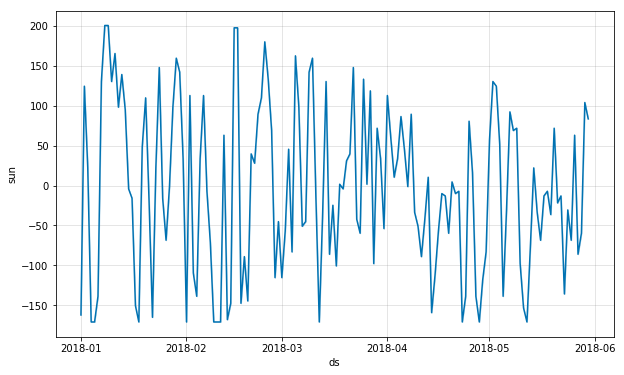

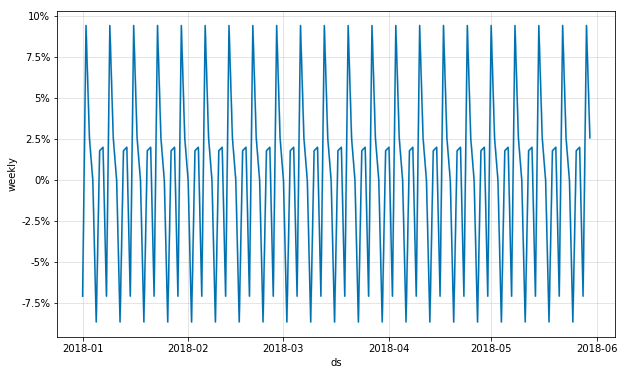

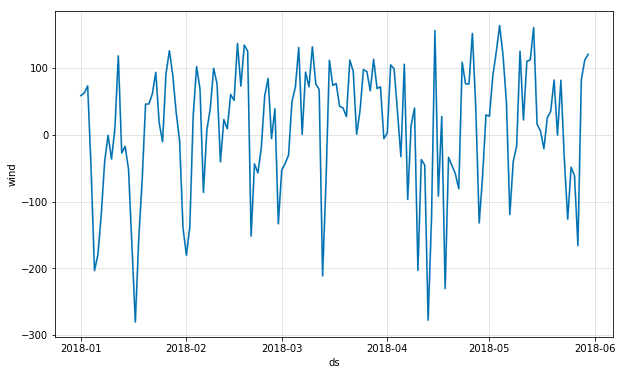

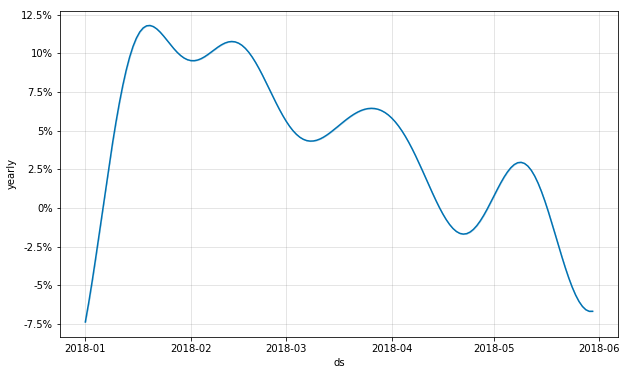

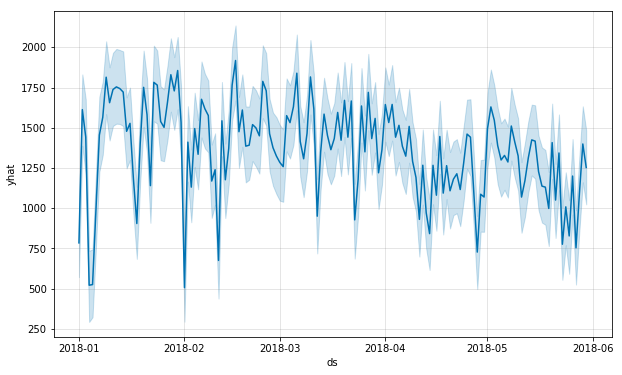

In [7]:
def prophet_func_121(pp_date=data_train['ds'].max(), original_data=data_train, fc=150,
                     relative_data_1=tempt, relative_data_2=RH, relative_data_3=rain,
                     relative_data_4=sun, relative_data_5=wind, holiday=holidays_df):
    '''
    prophet预测，节假日项、相关变量以加法方式进入模型，季节项以乘法方式进入模型。
    '''

    # 将相关变量切分为训练集和测试集，训练集用在Prophet.fit()中训练模型，测试集用在Prophet.predict()中生成目标变量的预测数据。
    end = str(pd.date_range(start=original_data['ds'].max(), periods=fc + 1).max())

    tempt_train = relative_data_1[
        (relative_data_1['ds'] >= original_data['ds'].min()) & (relative_data_1['ds'] <= pp_date)]
    tempt_test = relative_data_1[(relative_data_1['ds'] > pp_date) & (relative_data_1['ds'] <= end)]
    tempt_train.reset_index(drop=True, inplace=True)
    tempt_test.reset_index(drop=True, inplace=True)

    RH_train = relative_data_2[
        (relative_data_2['ds'] >= original_data['ds'].min()) & (relative_data_2['ds'] <= pp_date)]
    RH_test = relative_data_2[(relative_data_2['ds'] > pp_date) & (relative_data_2['ds'] <= end)]
    RH_train.reset_index(drop=True, inplace=True)
    RH_test.reset_index(drop=True, inplace=True)

    rain_train = relative_data_3[
        (relative_data_3['ds'] >= original_data['ds'].min()) & (relative_data_3['ds'] <= pp_date)]
    rain_test = relative_data_3[(relative_data_3['ds'] > pp_date) & (relative_data_3['ds'] <= end)]
    rain_train.reset_index(drop=True, inplace=True)
    rain_test.reset_index(drop=True, inplace=True)

    sun_train = relative_data_4[
        (relative_data_4['ds'] >= original_data['ds'].min()) & (relative_data_4['ds'] <= pp_date)]
    sun_test = relative_data_4[(relative_data_4['ds'] > pp_date) & (relative_data_4['ds'] <= end)]
    sun_train.reset_index(drop=True, inplace=True)
    sun_test.reset_index(drop=True, inplace=True)

    wind_train = relative_data_5[
        (relative_data_5['ds'] >= original_data['ds'].min()) & (relative_data_5['ds'] <= pp_date)]
    wind_test = relative_data_5[(relative_data_5['ds'] > pp_date) & (relative_data_5['ds'] <= end)]
    wind_train.reset_index(drop=True, inplace=True)
    wind_test.reset_index(drop=True, inplace=True)

    # 设置模型参数。“1”表示对应项以加法方式进入模型，“2”表示对应项以乘法方式进入模型。
    m121 = Prophet(holidays=holiday, holidays_prior_scale=0.25, changepoint_prior_scale=0.01,
                   seasonality_mode='additive', yearly_seasonality=False, weekly_seasonality=False,
                   daily_seasonality=False)
    # 内置固定及移动节假日
    m121.add_country_holidays(country_name='CN')
    # 设置多重季节性
    m121.add_seasonality(name='yearly', period=365, fourier_order=12, prior_scale=0.1, mode='multiplicative')
    m121.add_seasonality(name='seasonly', period=365 / 4, fourier_order=10, prior_scale=0.1, mode='multiplicative')
    m121.add_seasonality(name='monthly', period=365 / 12, fourier_order=8, prior_scale=0.1, mode='multiplicative')
    m121.add_seasonality(name='weekly', period=7, fourier_order=6, prior_scale=0.1, mode='multiplicative')
    # 设置相关变量
    m121.add_regressor(tempt_train.columns[1], prior_scale=0.03, mode='additive')
    m121.add_regressor(RH_train.columns[1], prior_scale=0.03, mode='additive')
    m121.add_regressor(rain_train.columns[1], prior_scale=0.03, mode='additive')
    m121.add_regressor(sun_train.columns[1], prior_scale=0.03, mode='additive')
    m121.add_regressor(wind_train.columns[1], prior_scale=0.03, mode='additive')
    # 拟合及预测数据
    datestamp = pd.date_range(end=pp_date, periods=len(original_data))
    df_train = pd.DataFrame({'ds': datestamp, 'y': original_data['y'],
                             tempt_train.columns[1]: tempt_train[tempt_train.columns[1]],
                             RH_train.columns[1]: RH_train[RH_train.columns[1]],
                             rain_train.columns[1]: rain_train[rain_train.columns[1]],
                             sun_train.columns[1]: sun_train[sun_train.columns[1]],
                             wind_train.columns[1]: wind_train[wind_train.columns[1]],
                             })
    m121.fit(df_train)
    future = m121.make_future_dataframe(periods=fc, freq='1D', include_history=False)
    future121 = pd.concat([future, tempt_test[tempt_test.columns[1]], RH_test[RH_test.columns[1]],
                           rain_test[rain_test.columns[1]], sun_test[sun_test.columns[1]],
                           wind_test[wind_test.columns[1]]], axis=1)
    forecast121 = m121.predict(future121)
    # 输出图形及数值预测结果
    fig1 = m121.plot(forecast121)
    fig2 = m121.plot_components(forecast121)
    for i in range(6, 70, 3):
        plot_forecast_component(m121, forecast121, forecast121.columns[i])

    prophet_amou = forecast121['yhat'].values
    trend_amou = forecast121['trend'].values
    holiday_amou = forecast121['holidays'].values
    seasonality_amou = forecast121['yearly'].values + forecast121['seasonly'].values \
                       + forecast121['monthly'].values + forecast121['weekly'].values
    relative_amou = forecast121['extra_regressors_additive'].values

    if False not in (prophet_amou - (trend_amou * (1+seasonality_amou) + holiday_amou + relative_amou) < 1e-10):
        prophet_amou_1 = prophet_amou
        trend_amou_1 = trend_amou
        holiday_amou_1 = holiday_amou
        seasonality_amou_1 = seasonality_amou
        relative_amou_1 = relative_amou
        prophet_amou_1 = [0 if i < 0 else i for i in prophet_amou_1]  # 只有prophet_amou_1的负值预测需用0代替，其余不能。
        return prophet_amou_1, trend_amou_1, holiday_amou_1, seasonality_amou_1, relative_amou_1
    else:
        return None
    
predict_result = []
predict_result = prophet_func_121()
predict_result


/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


([834.4665259352962,
  1652.8133957079726,
  1473.9533457276727,
  444.33692963264144,
  461.17478314986926,
  959.4812623536226,
  1474.75872504002,
  1608.3490748520082,
  1858.0471296901496,
  1691.5310631387472,
  1782.580003139058,
  1814.0121954278256,
  1785.2506882959544,
  1754.795636365985,
  1494.7350086678994,
  1529.423097805739,
  1159.5902335858566,
  846.7279727435398,
  1418.6625656636616,
  1797.7972674929345,
  1609.3808931254362,
  1126.9418799675311,
  1817.4778380898347,
  1812.3582153707575,
  1563.0616449950157,
  1535.2519434193582,
  1693.6859854508075,
  1890.2251406995563,
  1789.80925505255,
  1902.3724022738822,
  1555.8726330590987,
  405.92329824737953,
  1435.3984553395335,
  1100.110998743114,
  1508.1055084933514,
  1341.2816052647943,
  1702.1484294148381,
  1648.8918372556795,
  1606.7844143440047,
  1156.2703522643176,
  1212.5028141313903,
  577.1072946179414,
  1565.3942311219148,
  1131.211452157875,
  1370.428925770822,
  1832.3916542183772,
  

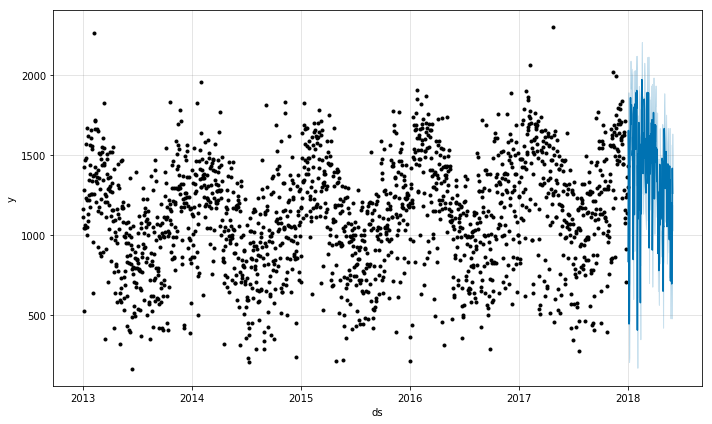

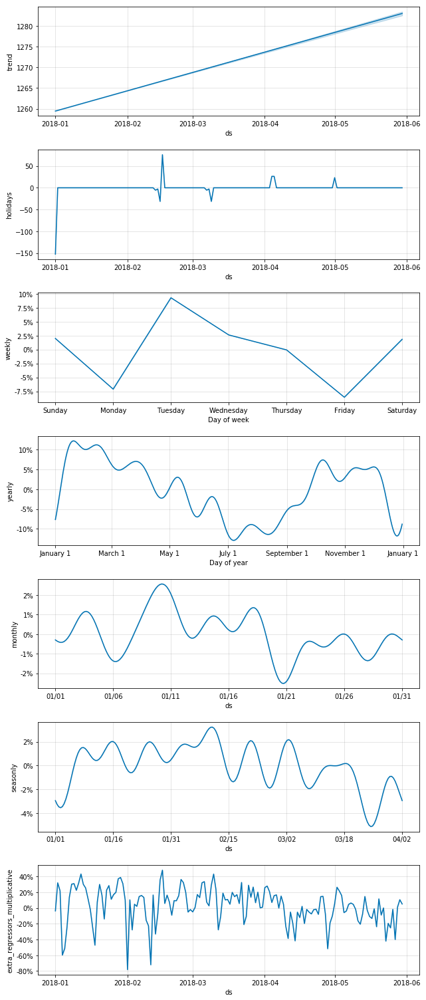

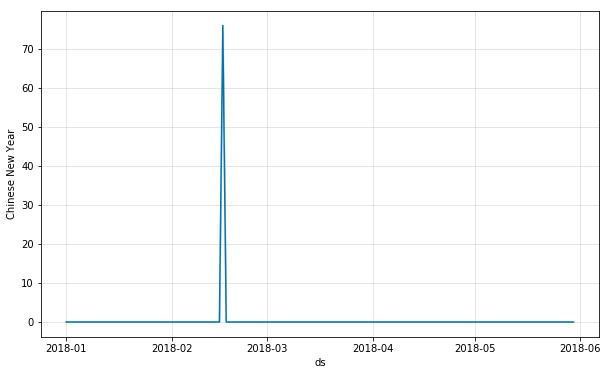

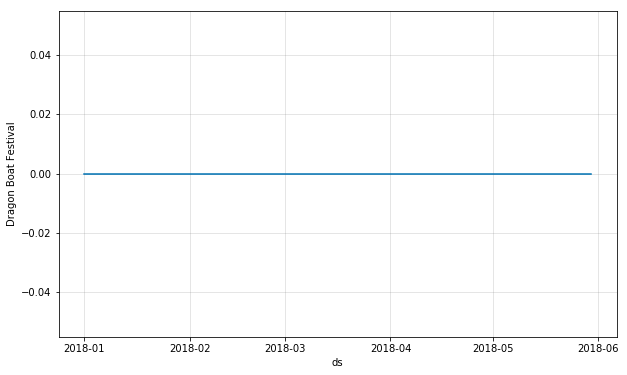

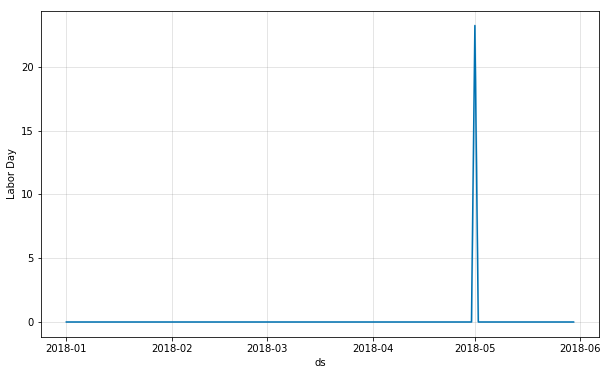

...

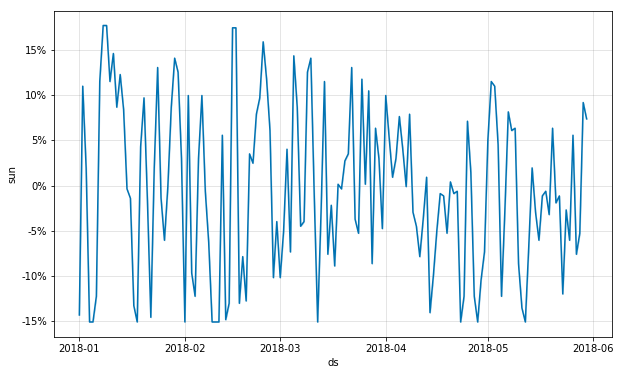

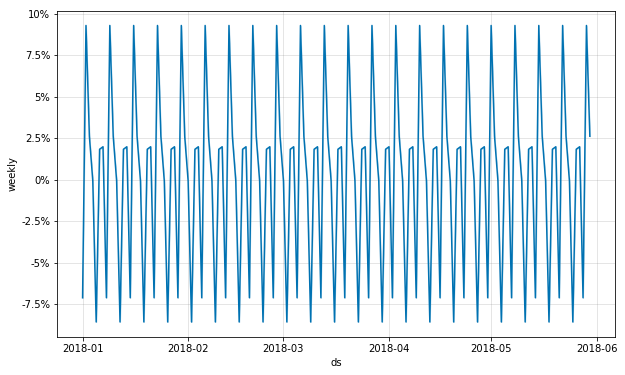

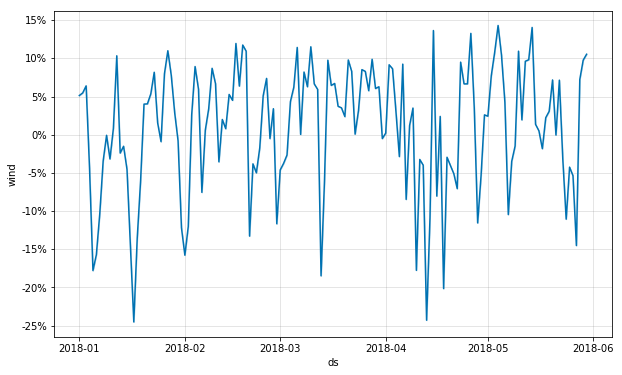

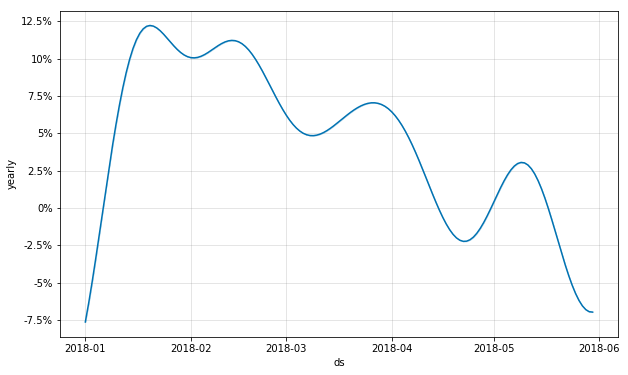

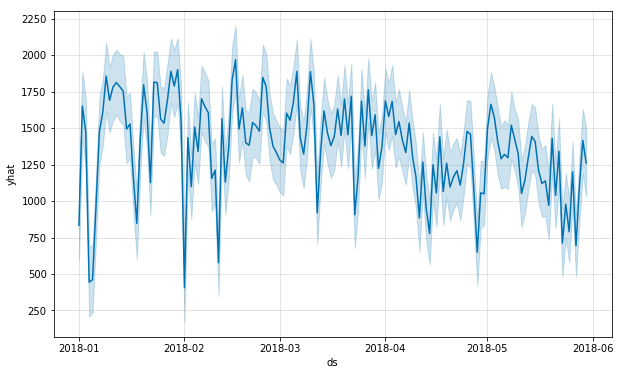

In [8]:
def prophet_func_122(pp_date=data_train['ds'].max(), original_data=data_train, fc=150,
                     relative_data_1=tempt, relative_data_2=RH, relative_data_3=rain,
                     relative_data_4=sun, relative_data_5=wind, holiday=holidays_df):
    '''
    prophet预测，节假日项以加法方式进入模型，季节项、相关变量以乘法方式进入模型。
    '''

    # 将相关变量切分为训练集和测试集，训练集用在Prophet.fit()中训练模型，测试集用在Prophet.predict()中生成目标变量的预测数据。
    end = str(pd.date_range(start=original_data['ds'].max(), periods=fc + 1).max())

    tempt_train = relative_data_1[
        (relative_data_1['ds'] >= original_data['ds'].min()) & (relative_data_1['ds'] <= pp_date)]
    tempt_test = relative_data_1[(relative_data_1['ds'] > pp_date) & (relative_data_1['ds'] <= end)]
    tempt_train.reset_index(drop=True, inplace=True)
    tempt_test.reset_index(drop=True, inplace=True)

    RH_train = relative_data_2[
        (relative_data_2['ds'] >= original_data['ds'].min()) & (relative_data_2['ds'] <= pp_date)]
    RH_test = relative_data_2[(relative_data_2['ds'] > pp_date) & (relative_data_2['ds'] <= end)]
    RH_train.reset_index(drop=True, inplace=True)
    RH_test.reset_index(drop=True, inplace=True)

    rain_train = relative_data_3[
        (relative_data_3['ds'] >= original_data['ds'].min()) & (relative_data_3['ds'] <= pp_date)]
    rain_test = relative_data_3[(relative_data_3['ds'] > pp_date) & (relative_data_3['ds'] <= end)]
    rain_train.reset_index(drop=True, inplace=True)
    rain_test.reset_index(drop=True, inplace=True)

    sun_train = relative_data_4[
        (relative_data_4['ds'] >= original_data['ds'].min()) & (relative_data_4['ds'] <= pp_date)]
    sun_test = relative_data_4[(relative_data_4['ds'] > pp_date) & (relative_data_4['ds'] <= end)]
    sun_train.reset_index(drop=True, inplace=True)
    sun_test.reset_index(drop=True, inplace=True)

    wind_train = relative_data_5[
        (relative_data_5['ds'] >= original_data['ds'].min()) & (relative_data_5['ds'] <= pp_date)]
    wind_test = relative_data_5[(relative_data_5['ds'] > pp_date) & (relative_data_5['ds'] <= end)]
    wind_train.reset_index(drop=True, inplace=True)
    wind_test.reset_index(drop=True, inplace=True)

    # 设置模型参数。“1”表示对应项以加法方式进入模型，“2”表示对应项以乘法方式进入模型。
    m122 = Prophet(holidays=holiday, holidays_prior_scale=0.25, changepoint_prior_scale=0.01,
                   seasonality_mode='additive', yearly_seasonality=False, weekly_seasonality=False,
                   daily_seasonality=False)
    # 内置固定及移动节假日
    m122.add_country_holidays(country_name='CN')
    # 设置多重季节性
    m122.add_seasonality(name='yearly', period=365, fourier_order=12, prior_scale=0.1, mode='multiplicative')
    m122.add_seasonality(name='seasonly', period=365 / 4, fourier_order=10, prior_scale=0.1, mode='multiplicative')
    m122.add_seasonality(name='monthly', period=365 / 12, fourier_order=8, prior_scale=0.1, mode='multiplicative')
    m122.add_seasonality(name='weekly', period=7, fourier_order=6, prior_scale=0.1, mode='multiplicative')
    # 设置相关变量
    m122.add_regressor(tempt_train.columns[1], prior_scale=0.03, mode='multiplicative')
    m122.add_regressor(RH_train.columns[1], prior_scale=0.03, mode='multiplicative')
    m122.add_regressor(rain_train.columns[1], prior_scale=0.03, mode='multiplicative')
    m122.add_regressor(sun_train.columns[1], prior_scale=0.03, mode='multiplicative')
    m122.add_regressor(wind_train.columns[1], prior_scale=0.03, mode='multiplicative')
    # 拟合及预测数据
    datestamp = pd.date_range(end=pp_date, periods=len(original_data))
    df_train = pd.DataFrame({'ds': datestamp, 'y': original_data['y'],
                             tempt_train.columns[1]: tempt_train[tempt_train.columns[1]],
                             RH_train.columns[1]: RH_train[RH_train.columns[1]],
                             rain_train.columns[1]: rain_train[rain_train.columns[1]],
                             sun_train.columns[1]: sun_train[sun_train.columns[1]],
                             wind_train.columns[1]: wind_train[wind_train.columns[1]],
                             })
    m122.fit(df_train)
    future = m122.make_future_dataframe(periods=fc, freq='1D', include_history=False)
    future122 = pd.concat([future, tempt_test[tempt_test.columns[1]], RH_test[RH_test.columns[1]],
                           rain_test[rain_test.columns[1]], sun_test[sun_test.columns[1]],
                           wind_test[wind_test.columns[1]]], axis=1)
    forecast122 = m122.predict(future122)
    # 输出图形及数值预测结果
    fig1 = m122.plot(forecast122)
    fig2 = m122.plot_components(forecast122)
    for i in range(6, 70, 3):
        plot_forecast_component(m122, forecast122, forecast122.columns[i])

    prophet_amou = forecast122['yhat'].values
    trend_amou = forecast122['trend'].values
    holiday_amou = forecast122['holidays'].values
    seasonality_amou = forecast122['yearly'].values + forecast122['seasonly'].values \
                       + forecast122['monthly'].values + forecast122['weekly'].values
    relative_amou = forecast122['extra_regressors_multiplicative'].values

    if False not in (prophet_amou - (trend_amou * (1+seasonality_amou+relative_amou) + holiday_amou) < 1e-10):
        prophet_amou_1 = prophet_amou
        trend_amou_1 = trend_amou
        holiday_amou_1 = holiday_amou
        seasonality_amou_1 = seasonality_amou
        relative_amou_1 = relative_amou
        prophet_amou_1 = [0 if i < 0 else i for i in prophet_amou_1]  # 只有prophet_amou_1的负值预测需用0代替，其余不能。
        return prophet_amou_1, trend_amou_1, holiday_amou_1, seasonality_amou_1, relative_amou_1
    else:
        return None

predict_result = []
predict_result = prophet_func_122()
predict_result


/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


([963.9725980400394,
  1604.2879777214682,
  1445.2104296353032,
  521.2184276383931,
  536.5853503958206,
  989.1945005628243,
  1447.5597368896613,
  1563.8954809204188,
  1786.86498854593,
  1637.0505089698265,
  1719.77191529015,
  1748.9955397889719,
  1732.0631958897407,
  1705.3305669173062,
  1469.1928042255324,
  1494.1678013015028,
  1160.1080838424928,
  886.1106408564466,
  1396.3797785846327,
  1740.503062328036,
  1569.0200281997331,
  1136.641806943869,
  1750.5897792682072,
  1745.1827324891624,
  1521.1376724700826,
  1496.6296315242435,
  1646.3158718842237,
  1820.749737475709,
  1727.9419804977238,
  1822.2731584243961,
  1510.4436717792523,
  491.6513957789274,
  1410.3797475488884,
  1115.544497307992,
  1472.977688175016,
  1327.221355379007,
  1645.9423685181393,
  1597.296103035422,
  1558.7621491007237,
  1165.090568195174,
  1220.9418608128092,
  647.8970781113553,
  1529.4752457547931,
  1141.059678284606,
  1356.653110078579,
  1764.5693734120223,
  1837.86

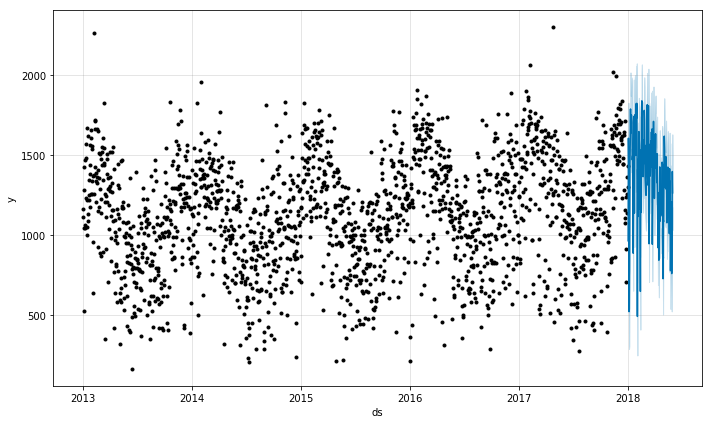

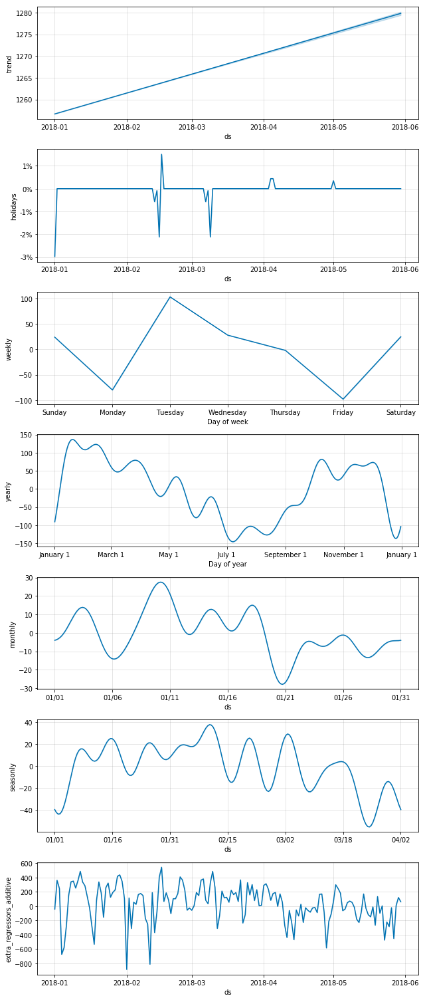

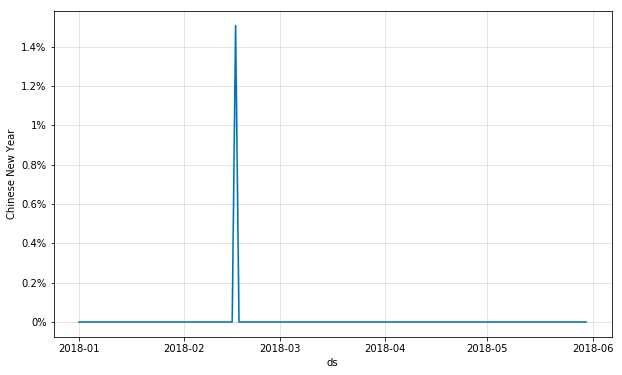

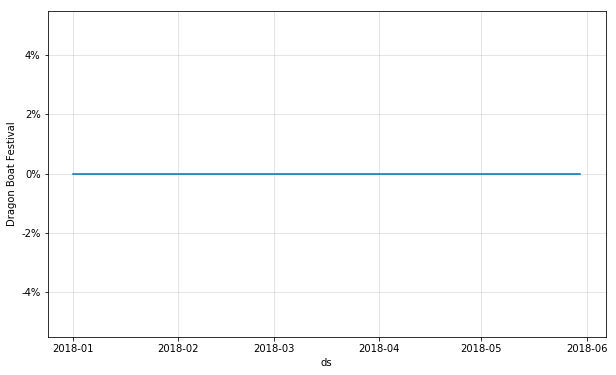

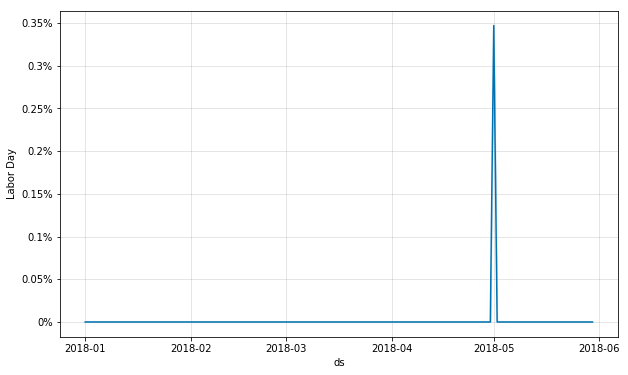

...

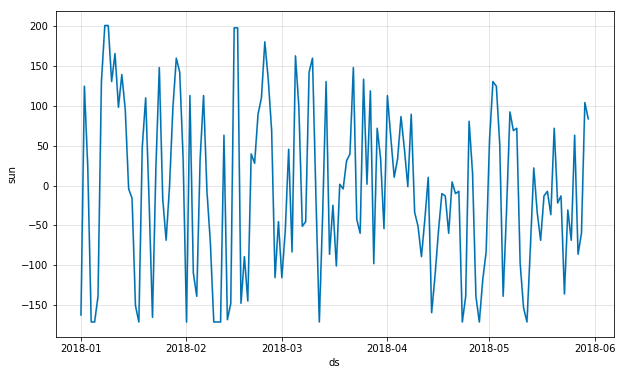

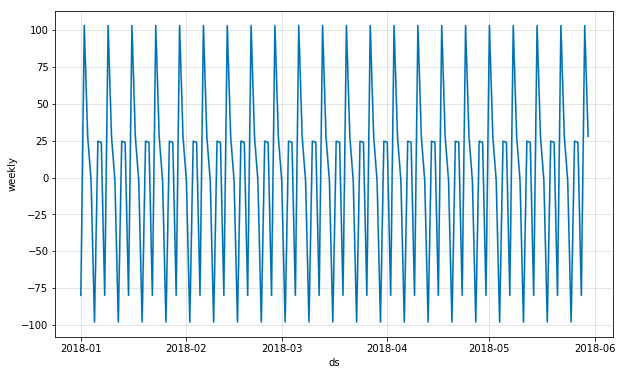

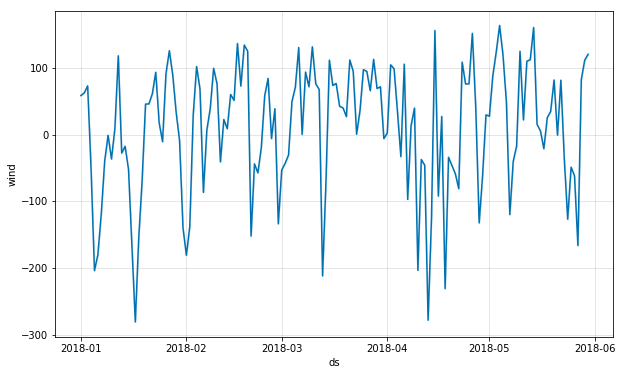

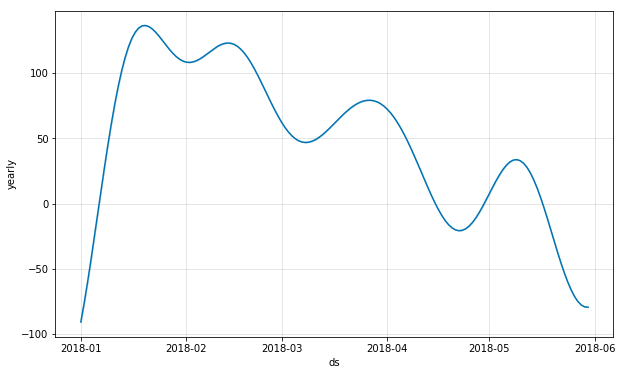

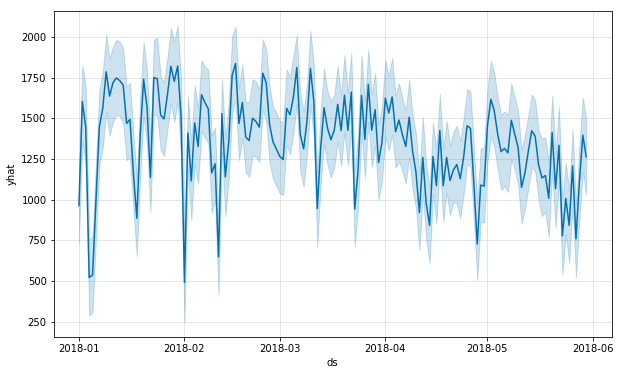

In [9]:
def prophet_func_211(pp_date=data_train['ds'].max(), original_data=data_train, fc=150,
                     relative_data_1=tempt, relative_data_2=RH, relative_data_3=rain,
                     relative_data_4=sun, relative_data_5=wind, holiday=holidays_df):
    '''
    prophet预测，节假日项以乘法方式进入模型，季节项、相关变量以加法方式进入模型。
    '''

    # 将相关变量切分为训练集和测试集，训练集用在Prophet.fit()中训练模型，测试集用在Prophet.predict()中生成目标变量的预测数据。
    end = str(pd.date_range(start=original_data['ds'].max(), periods=fc + 1).max())

    tempt_train = relative_data_1[
        (relative_data_1['ds'] >= original_data['ds'].min()) & (relative_data_1['ds'] <= pp_date)]
    tempt_test = relative_data_1[(relative_data_1['ds'] > pp_date) & (relative_data_1['ds'] <= end)]
    tempt_train.reset_index(drop=True, inplace=True)
    tempt_test.reset_index(drop=True, inplace=True)

    RH_train = relative_data_2[
        (relative_data_2['ds'] >= original_data['ds'].min()) & (relative_data_2['ds'] <= pp_date)]
    RH_test = relative_data_2[(relative_data_2['ds'] > pp_date) & (relative_data_2['ds'] <= end)]
    RH_train.reset_index(drop=True, inplace=True)
    RH_test.reset_index(drop=True, inplace=True)

    rain_train = relative_data_3[
        (relative_data_3['ds'] >= original_data['ds'].min()) & (relative_data_3['ds'] <= pp_date)]
    rain_test = relative_data_3[(relative_data_3['ds'] > pp_date) & (relative_data_3['ds'] <= end)]
    rain_train.reset_index(drop=True, inplace=True)
    rain_test.reset_index(drop=True, inplace=True)

    sun_train = relative_data_4[
        (relative_data_4['ds'] >= original_data['ds'].min()) & (relative_data_4['ds'] <= pp_date)]
    sun_test = relative_data_4[(relative_data_4['ds'] > pp_date) & (relative_data_4['ds'] <= end)]
    sun_train.reset_index(drop=True, inplace=True)
    sun_test.reset_index(drop=True, inplace=True)

    wind_train = relative_data_5[
        (relative_data_5['ds'] >= original_data['ds'].min()) & (relative_data_5['ds'] <= pp_date)]
    wind_test = relative_data_5[(relative_data_5['ds'] > pp_date) & (relative_data_5['ds'] <= end)]
    wind_train.reset_index(drop=True, inplace=True)
    wind_test.reset_index(drop=True, inplace=True)

    # 设置模型参数。“1”表示对应项以加法方式进入模型，“2”表示对应项以乘法方式进入模型。
    m211 = Prophet(holidays=holiday, holidays_prior_scale=0.25, changepoint_prior_scale=0.01,
                   seasonality_mode='multiplicative', yearly_seasonality=False, weekly_seasonality=False,
                   daily_seasonality=False)
    # 内置固定及移动节假日
    m211.add_country_holidays(country_name='CN')
    # 设置多重季节性
    m211.add_seasonality(name='yearly', period=365, fourier_order=12, prior_scale=0.1, mode='additive')
    m211.add_seasonality(name='seasonly', period=365 / 4, fourier_order=10, prior_scale=0.1, mode='additive')
    m211.add_seasonality(name='monthly', period=365 / 12, fourier_order=8, prior_scale=0.1, mode='additive')
    m211.add_seasonality(name='weekly', period=7, fourier_order=6, prior_scale=0.1, mode='additive')
    # 设置相关变量
    m211.add_regressor(tempt_train.columns[1], prior_scale=0.03, mode='additive')
    m211.add_regressor(RH_train.columns[1], prior_scale=0.03, mode='additive')
    m211.add_regressor(rain_train.columns[1], prior_scale=0.03, mode='additive')
    m211.add_regressor(sun_train.columns[1], prior_scale=0.03, mode='additive')
    m211.add_regressor(wind_train.columns[1], prior_scale=0.03, mode='additive')
    # 拟合及预测数据
    datestamp = pd.date_range(end=pp_date, periods=len(original_data))
    df_train = pd.DataFrame({'ds': datestamp, 'y': original_data['y'],
                             tempt_train.columns[1]: tempt_train[tempt_train.columns[1]],
                             RH_train.columns[1]: RH_train[RH_train.columns[1]],
                             rain_train.columns[1]: rain_train[rain_train.columns[1]],
                             sun_train.columns[1]: sun_train[sun_train.columns[1]],
                             wind_train.columns[1]: wind_train[wind_train.columns[1]],
                             })
    m211.fit(df_train)
    future = m211.make_future_dataframe(periods=fc, freq='1D', include_history=False)
    future211 = pd.concat([future, tempt_test[tempt_test.columns[1]], RH_test[RH_test.columns[1]],
                           rain_test[rain_test.columns[1]], sun_test[sun_test.columns[1]],
                           wind_test[wind_test.columns[1]]], axis=1)
    forecast211 = m211.predict(future211)
    # 输出图形及数值预测结果
    fig1 = m211.plot(forecast211)
    fig2 = m211.plot_components(forecast211)
    for i in range(6, 70, 3):
        plot_forecast_component(m211, forecast211, forecast211.columns[i])

    prophet_amou = forecast211['yhat'].values
    trend_amou = forecast211['trend'].values
    holiday_amou = forecast211['holidays'].values
    seasonality_amou = forecast211['yearly'].values + forecast211['seasonly'].values \
                       + forecast211['monthly'].values + forecast211['weekly'].values
    relative_amou = forecast211['extra_regressors_additive'].values

    if False not in (prophet_amou - (trend_amou * (1+holiday_amou) + seasonality_amou + relative_amou) < 1e-10):
        prophet_amou_1 = prophet_amou
        trend_amou_1 = trend_amou
        holiday_amou_1 = holiday_amou
        seasonality_amou_1 = seasonality_amou
        relative_amou_1 = relative_amou
        prophet_amou_1 = [0 if i < 0 else i for i in prophet_amou_1]  # 只有prophet_amou_1的负值预测需用0代替，其余不能。
        return prophet_amou_1, trend_amou_1, holiday_amou_1, seasonality_amou_1, relative_amou_1
    else:
        return None

predict_result = []
predict_result = prophet_func_211()
predict_result


/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


([956.1957481022432,
  1645.4635369240468,
  1475.9081666081306,
  447.4090501702584,
  476.02211445951644,
  961.8631253066467,
  1466.756277492773,
  1604.915576229562,
  1828.8598820620605,
  1671.0351520971667,
  1761.7247853662677,
  1803.9930927014843,
  1768.238399863225,
  1734.2398128363482,
  1482.4857537103198,
  1493.596429078385,
  1134.9954883771484,
  827.7561276128753,
  1408.1152088166534,
  1781.3050907788524,
  1593.3380503665476,
  1122.0440573330845,
  1781.4608951087873,
  1786.2270228849711,
  1540.2005903311938,
  1523.9677627622327,
  1675.8719416144597,
  1871.991688310183,
  1780.8396673632428,
  1866.065986531792,
  1530.6910698370182,
  389.96388132484094,
  1429.1729467712505,
  1084.8449586056756,
  1487.1255560053592,
  1332.648997767826,
  1668.9392977749785,
  1626.0552275720308,
  1588.8602516695262,
  1154.9528010402125,
  1195.9990232563573,
  552.470621675865,
  1549.3859407195741,
  1093.7609799626027,
  1349.3128360253995,
  1815.7779473633225,
 

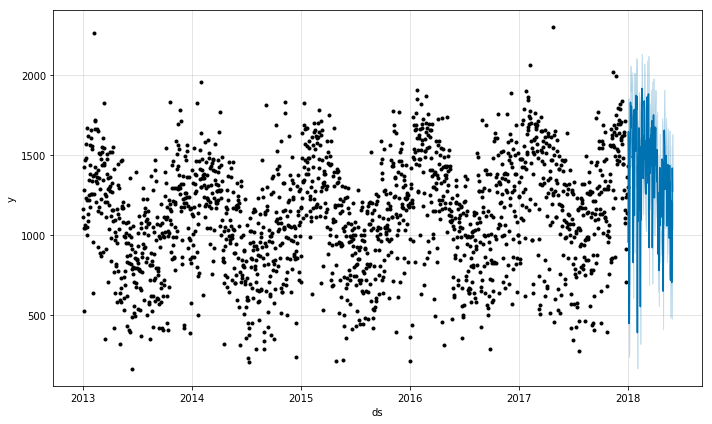

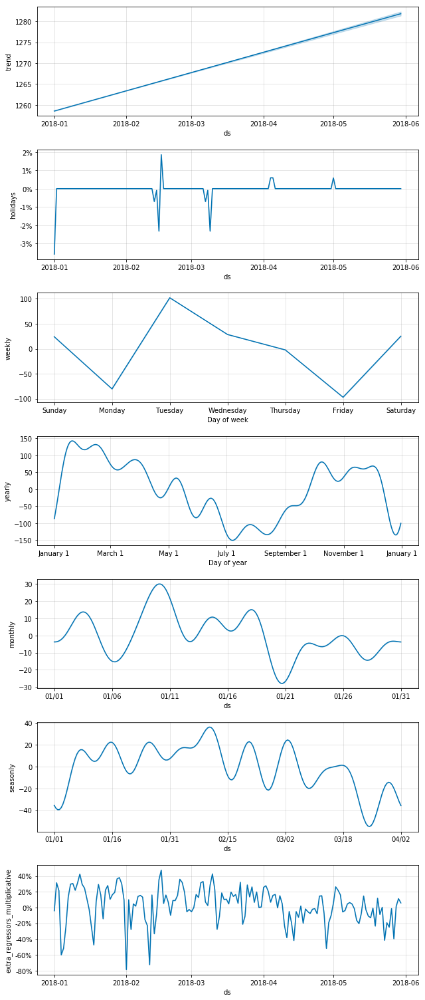

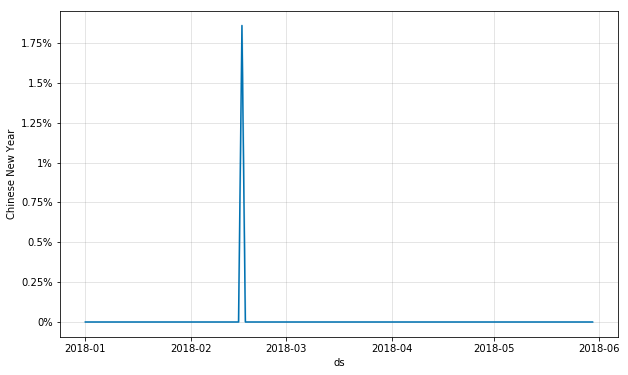

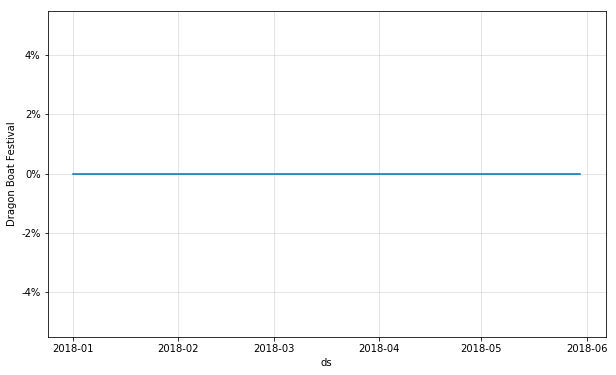

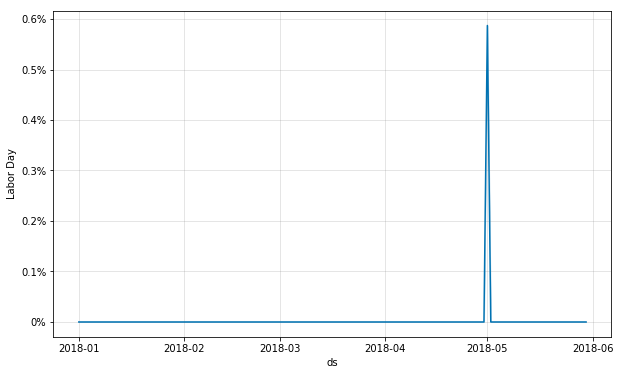

...

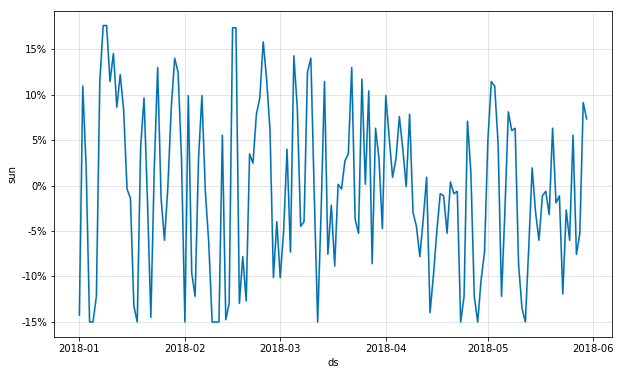

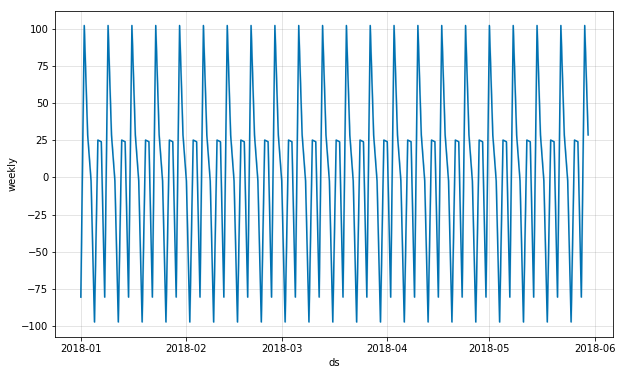

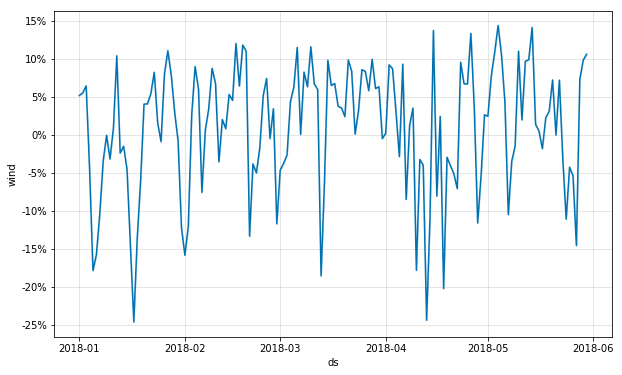

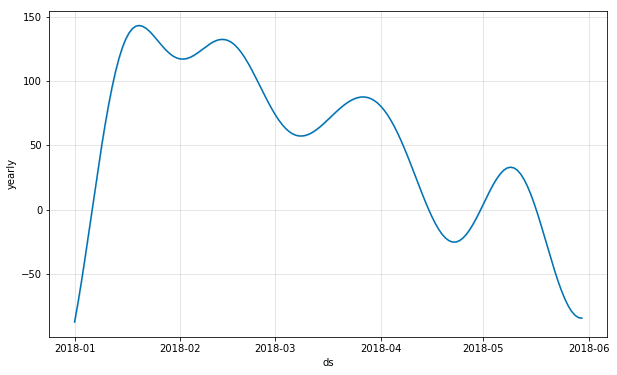

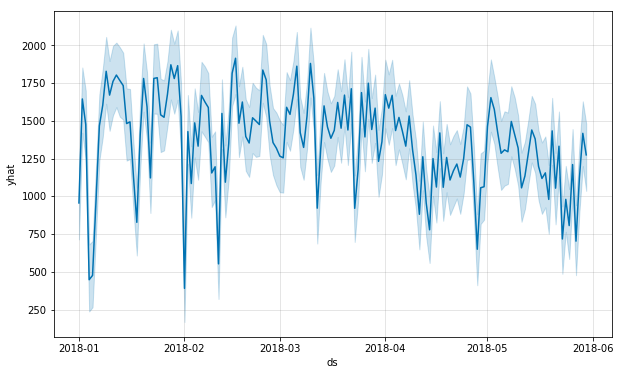

In [10]:
def prophet_func_212(pp_date=data_train['ds'].max(), original_data=data_train, fc=150,
                     relative_data_1=tempt, relative_data_2=RH, relative_data_3=rain,
                     relative_data_4=sun, relative_data_5=wind, holiday=holidays_df):
    '''
    prophet预测，节假日项、相关变量以乘法方式进入模型，季节项以加法方式进入模型。
    '''

    # 将相关变量切分为训练集和测试集，训练集用在Prophet.fit()中训练模型，测试集用在Prophet.predict()中生成目标变量的预测数据。
    end = str(pd.date_range(start=original_data['ds'].max(), periods=fc + 1).max())

    tempt_train = relative_data_1[
        (relative_data_1['ds'] >= original_data['ds'].min()) & (relative_data_1['ds'] <= pp_date)]
    tempt_test = relative_data_1[(relative_data_1['ds'] > pp_date) & (relative_data_1['ds'] <= end)]
    tempt_train.reset_index(drop=True, inplace=True)
    tempt_test.reset_index(drop=True, inplace=True)

    RH_train = relative_data_2[
        (relative_data_2['ds'] >= original_data['ds'].min()) & (relative_data_2['ds'] <= pp_date)]
    RH_test = relative_data_2[(relative_data_2['ds'] > pp_date) & (relative_data_2['ds'] <= end)]
    RH_train.reset_index(drop=True, inplace=True)
    RH_test.reset_index(drop=True, inplace=True)

    rain_train = relative_data_3[
        (relative_data_3['ds'] >= original_data['ds'].min()) & (relative_data_3['ds'] <= pp_date)]
    rain_test = relative_data_3[(relative_data_3['ds'] > pp_date) & (relative_data_3['ds'] <= end)]
    rain_train.reset_index(drop=True, inplace=True)
    rain_test.reset_index(drop=True, inplace=True)

    sun_train = relative_data_4[
        (relative_data_4['ds'] >= original_data['ds'].min()) & (relative_data_4['ds'] <= pp_date)]
    sun_test = relative_data_4[(relative_data_4['ds'] > pp_date) & (relative_data_4['ds'] <= end)]
    sun_train.reset_index(drop=True, inplace=True)
    sun_test.reset_index(drop=True, inplace=True)

    wind_train = relative_data_5[
        (relative_data_5['ds'] >= original_data['ds'].min()) & (relative_data_5['ds'] <= pp_date)]
    wind_test = relative_data_5[(relative_data_5['ds'] > pp_date) & (relative_data_5['ds'] <= end)]
    wind_train.reset_index(drop=True, inplace=True)
    wind_test.reset_index(drop=True, inplace=True)

    # 设置模型参数。“1”表示对应项以加法方式进入模型，“2”表示对应项以乘法方式进入模型。
    m212 = Prophet(holidays=holiday, holidays_prior_scale=0.25, changepoint_prior_scale=0.01,
                   seasonality_mode='multiplicative', yearly_seasonality=False, weekly_seasonality=False,
                   daily_seasonality=False)
    # 内置固定及移动节假日
    m212.add_country_holidays(country_name='CN')
    # 设置多重季节性
    m212.add_seasonality(name='yearly', period=365, fourier_order=12, prior_scale=0.1, mode='additive')
    m212.add_seasonality(name='seasonly', period=365 / 4, fourier_order=10, prior_scale=0.1, mode='additive')
    m212.add_seasonality(name='monthly', period=365 / 12, fourier_order=8, prior_scale=0.1, mode='additive')
    m212.add_seasonality(name='weekly', period=7, fourier_order=6, prior_scale=0.1, mode='additive')
    # 设置相关变量
    m212.add_regressor(tempt_train.columns[1], prior_scale=0.03, mode='multiplicative')
    m212.add_regressor(RH_train.columns[1], prior_scale=0.03, mode='multiplicative')
    m212.add_regressor(rain_train.columns[1], prior_scale=0.03, mode='multiplicative')
    m212.add_regressor(sun_train.columns[1], prior_scale=0.03, mode='multiplicative')
    m212.add_regressor(wind_train.columns[1], prior_scale=0.03, mode='multiplicative')
    # 拟合及预测数据
    datestamp = pd.date_range(end=pp_date, periods=len(original_data))
    df_train = pd.DataFrame({'ds': datestamp, 'y': original_data['y'],
                             tempt_train.columns[1]: tempt_train[tempt_train.columns[1]],
                             RH_train.columns[1]: RH_train[RH_train.columns[1]],
                             rain_train.columns[1]: rain_train[rain_train.columns[1]],
                             sun_train.columns[1]: sun_train[sun_train.columns[1]],
                             wind_train.columns[1]: wind_train[wind_train.columns[1]],
                             })
    m212.fit(df_train)
    future = m212.make_future_dataframe(periods=fc, freq='1D', include_history=False)
    future212 = pd.concat([future, tempt_test[tempt_test.columns[1]], RH_test[RH_test.columns[1]],
                           rain_test[rain_test.columns[1]], sun_test[sun_test.columns[1]],
                           wind_test[wind_test.columns[1]]], axis=1)
    forecast212 = m212.predict(future212)
    # 输出图形及数值预测结果
    fig1 = m212.plot(forecast212)
    fig2 = m212.plot_components(forecast212)
    for i in range(6, 70, 3):
        plot_forecast_component(m212, forecast212, forecast212.columns[i])

    prophet_amou = forecast212['yhat'].values
    trend_amou = forecast212['trend'].values
    holiday_amou = forecast212['holidays'].values
    seasonality_amou = forecast212['yearly'].values + forecast212['seasonly'].values \
                       + forecast212['monthly'].values + forecast212['weekly'].values
    relative_amou = forecast212['extra_regressors_multiplicative'].values

    if False not in (prophet_amou - (trend_amou * (1+holiday_amou+relative_amou) + seasonality_amou) < 1e-10):
        prophet_amou_1 = prophet_amou
        trend_amou_1 = trend_amou
        holiday_amou_1 = holiday_amou
        seasonality_amou_1 = seasonality_amou
        relative_amou_1 = relative_amou
        prophet_amou_1 = [0 if i < 0 else i for i in prophet_amou_1]  # 只有prophet_amou_1的负值预测需用0代替，其余不能。
        return prophet_amou_1, trend_amou_1, holiday_amou_1, seasonality_amou_1, relative_amou_1
    else:
        return None

predict_result = []
predict_result = prophet_func_212()
predict_result


/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


([934.8886807453133,
  1602.1315415395736,
  1436.7665099802957,
  515.1675026922422,
  521.3907118410145,
  986.1265046031671,
  1452.8376143188777,
  1562.8625020580007,
  1811.907963435304,
  1652.4019580120328,
  1734.2814219648053,
  1750.944329722096,
  1744.9624343091527,
  1723.4206146240927,
  1479.5238614547352,
  1530.7465806315452,
  1186.0778541545876,
  911.4438625922373,
  1408.4369115693746,
  1758.0139586018465,
  1586.7323701399487,
  1146.2426980862729,
  1788.0034450468506,
  1772.7033813753092,
  1545.8154953466212,
  1508.5704935598578,
  1667.5514277980305,
  1843.314148449716,
  1739.1005116416986,
  1858.5203811545987,
  1534.7452076150387,
  514.1180611383244,
  1424.5599171564616,
  1141.8373199926873,
  1499.2020987802418,
  1338.860649828828,
  1682.6347644312546,
  1622.6008530678482,
  1582.3553303877127,
  1177.4727522644453,
  1245.3895619254902,
  676.4640262207852,
  1545.2973294330518,
  1180.9678774291579,
  1381.1079792699225,
  1783.5831586872116,

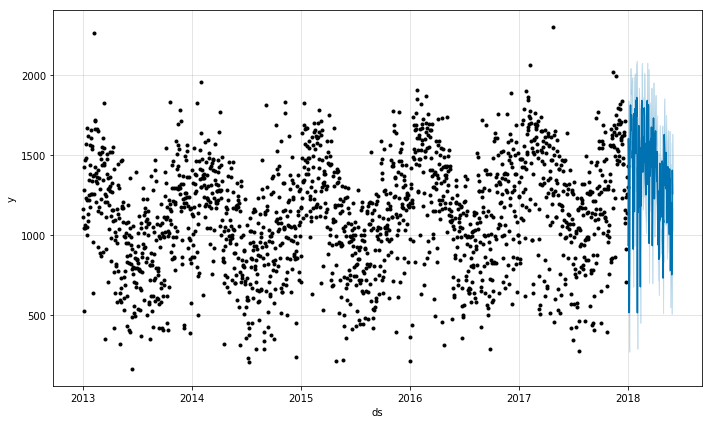

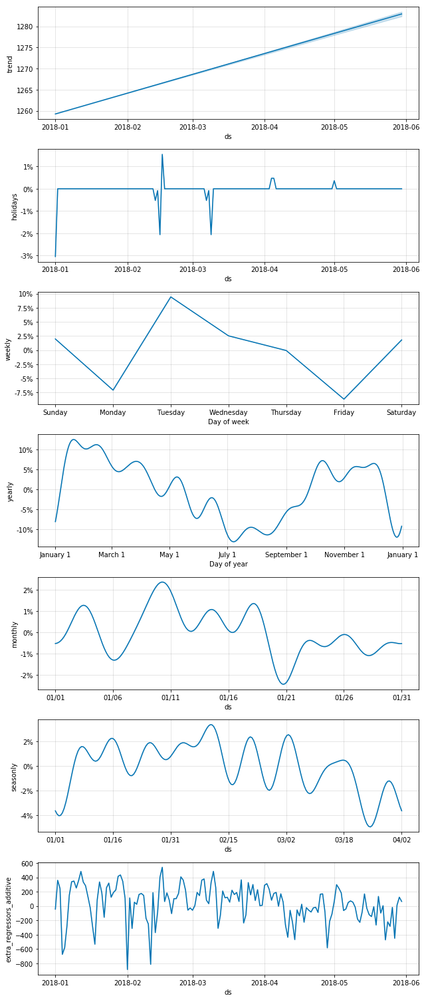

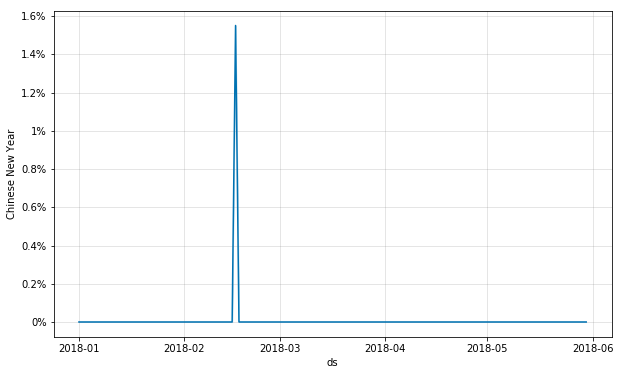

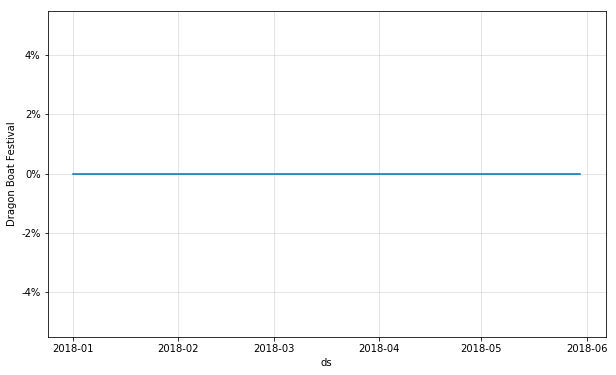

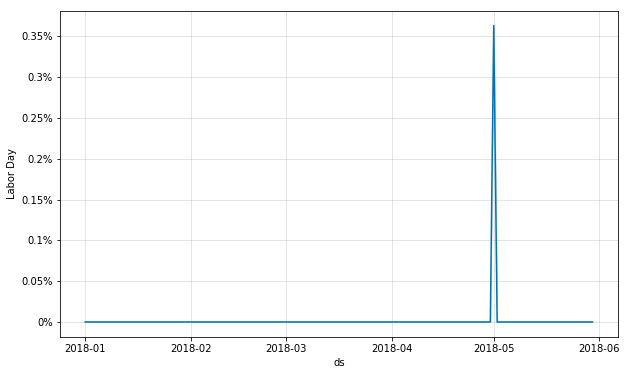

...

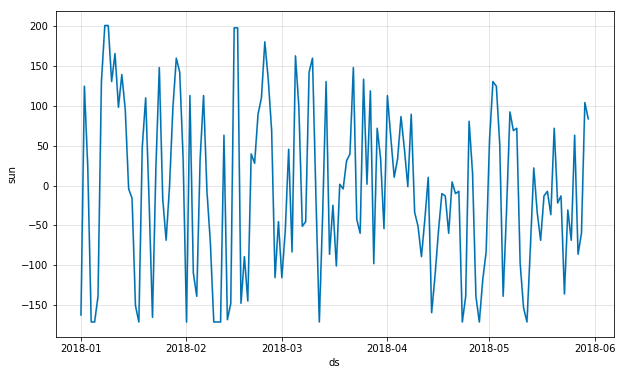

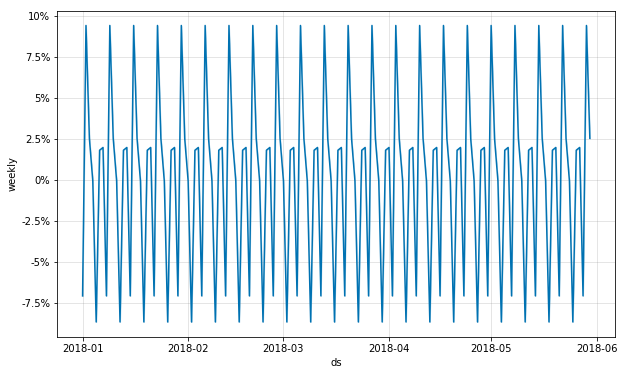

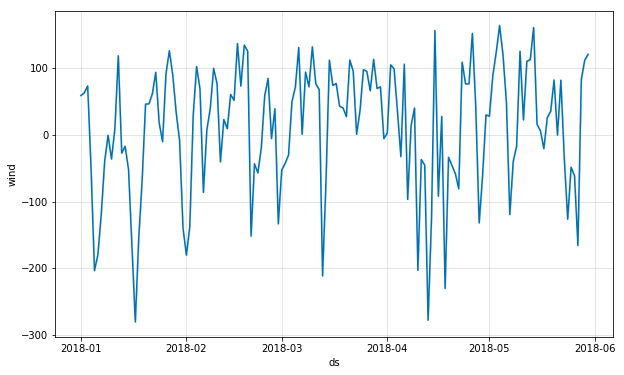

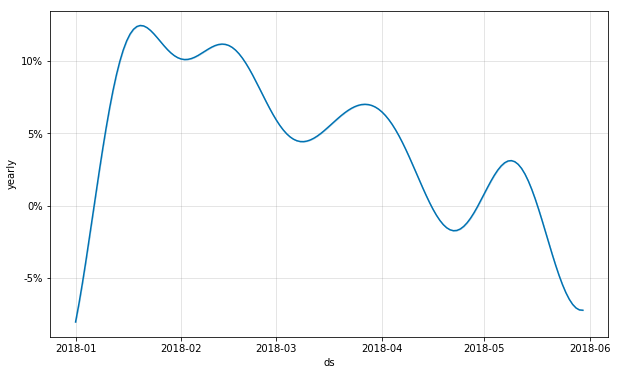

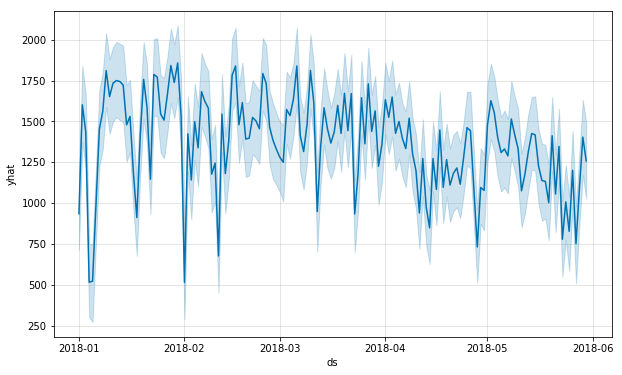

In [11]:
def prophet_func_221(pp_date=data_train['ds'].max(), original_data=data_train, fc=150,
                     relative_data_1=tempt, relative_data_2=RH, relative_data_3=rain,
                     relative_data_4=sun, relative_data_5=wind, holiday=holidays_df):
    '''
    prophet预测，节假日项、季节项以乘法方式进入模型，相关变量以加法方式进入模型。
    '''

    # 将相关变量切分为训练集和测试集，训练集用在Prophet.fit()中训练模型，测试集用在Prophet.predict()中生成目标变量的预测数据。
    end = str(pd.date_range(start=original_data['ds'].max(), periods=fc + 1).max())

    tempt_train = relative_data_1[
        (relative_data_1['ds'] >= original_data['ds'].min()) & (relative_data_1['ds'] <= pp_date)]
    tempt_test = relative_data_1[(relative_data_1['ds'] > pp_date) & (relative_data_1['ds'] <= end)]
    tempt_train.reset_index(drop=True, inplace=True)
    tempt_test.reset_index(drop=True, inplace=True)

    RH_train = relative_data_2[
        (relative_data_2['ds'] >= original_data['ds'].min()) & (relative_data_2['ds'] <= pp_date)]
    RH_test = relative_data_2[(relative_data_2['ds'] > pp_date) & (relative_data_2['ds'] <= end)]
    RH_train.reset_index(drop=True, inplace=True)
    RH_test.reset_index(drop=True, inplace=True)

    rain_train = relative_data_3[
        (relative_data_3['ds'] >= original_data['ds'].min()) & (relative_data_3['ds'] <= pp_date)]
    rain_test = relative_data_3[(relative_data_3['ds'] > pp_date) & (relative_data_3['ds'] <= end)]
    rain_train.reset_index(drop=True, inplace=True)
    rain_test.reset_index(drop=True, inplace=True)

    sun_train = relative_data_4[
        (relative_data_4['ds'] >= original_data['ds'].min()) & (relative_data_4['ds'] <= pp_date)]
    sun_test = relative_data_4[(relative_data_4['ds'] > pp_date) & (relative_data_4['ds'] <= end)]
    sun_train.reset_index(drop=True, inplace=True)
    sun_test.reset_index(drop=True, inplace=True)

    wind_train = relative_data_5[
        (relative_data_5['ds'] >= original_data['ds'].min()) & (relative_data_5['ds'] <= pp_date)]
    wind_test = relative_data_5[(relative_data_5['ds'] > pp_date) & (relative_data_5['ds'] <= end)]
    wind_train.reset_index(drop=True, inplace=True)
    wind_test.reset_index(drop=True, inplace=True)

    # 设置模型参数。“1”表示对应项以加法方式进入模型，“2”表示对应项以乘法方式进入模型。
    m221 = Prophet(holidays=holiday, holidays_prior_scale=0.25, changepoint_prior_scale=0.01,
                   seasonality_mode='multiplicative', yearly_seasonality=False, weekly_seasonality=False,
                   daily_seasonality=False)
    # 内置固定及移动节假日
    m221.add_country_holidays(country_name='CN')
    # 设置多重季节性
    m221.add_seasonality(name='yearly', period=365, fourier_order=12, prior_scale=0.1, mode='multiplicative')
    m221.add_seasonality(name='seasonly', period=365 / 4, fourier_order=10, prior_scale=0.1, mode='multiplicative')
    m221.add_seasonality(name='monthly', period=365 / 12, fourier_order=8, prior_scale=0.1, mode='multiplicative')
    m221.add_seasonality(name='weekly', period=7, fourier_order=6, prior_scale=0.1, mode='multiplicative')
    # 设置相关变量
    m221.add_regressor(tempt_train.columns[1], prior_scale=0.03, mode='additive')
    m221.add_regressor(RH_train.columns[1], prior_scale=0.03, mode='additive')
    m221.add_regressor(rain_train.columns[1], prior_scale=0.03, mode='additive')
    m221.add_regressor(sun_train.columns[1], prior_scale=0.03, mode='additive')
    m221.add_regressor(wind_train.columns[1], prior_scale=0.03, mode='additive')
    # 拟合及预测数据
    datestamp = pd.date_range(end=pp_date, periods=len(original_data))
    df_train = pd.DataFrame({'ds': datestamp, 'y': original_data['y'],
                             tempt_train.columns[1]: tempt_train[tempt_train.columns[1]],
                             RH_train.columns[1]: RH_train[RH_train.columns[1]],
                             rain_train.columns[1]: rain_train[rain_train.columns[1]],
                             sun_train.columns[1]: sun_train[sun_train.columns[1]],
                             wind_train.columns[1]: wind_train[wind_train.columns[1]],
                             })
    m221.fit(df_train)
    future = m221.make_future_dataframe(periods=fc, freq='1D', include_history=False)
    future221 = pd.concat([future, tempt_test[tempt_test.columns[1]], RH_test[RH_test.columns[1]],
                           rain_test[rain_test.columns[1]], sun_test[sun_test.columns[1]],
                           wind_test[wind_test.columns[1]]], axis=1)
    forecast221 = m221.predict(future221)
    # 输出图形及数值预测结果
    fig1 = m221.plot(forecast221)
    fig2 = m221.plot_components(forecast221)
    for i in range(6, 70, 3):
        plot_forecast_component(m221, forecast221, forecast221.columns[i])

    prophet_amou = forecast221['yhat'].values
    trend_amou = forecast221['trend'].values
    holiday_amou = forecast221['holidays'].values
    seasonality_amou = forecast221['yearly'].values + forecast221['seasonly'].values \
                       + forecast221['monthly'].values + forecast221['weekly'].values
    relative_amou = forecast221['extra_regressors_additive'].values

    if False not in (prophet_amou - (trend_amou * (1+holiday_amou+seasonality_amou) + relative_amou) < 1e-10):
        prophet_amou_1 = prophet_amou
        trend_amou_1 = trend_amou
        holiday_amou_1 = holiday_amou
        seasonality_amou_1 = seasonality_amou
        relative_amou_1 = relative_amou
        prophet_amou_1 = [0 if i < 0 else i for i in prophet_amou_1]  # 只有prophet_amou_1的负值预测需用0代替，其余不能。
        return prophet_amou_1, trend_amou_1, holiday_amou_1, seasonality_amou_1, relative_amou_1
    else:
        return None

predict_result = []
predict_result = prophet_func_221()
predict_result


In [12]:
print('共耗时：{0}分钟'.format((time.clock()-t0)/60))

共耗时：2.7242176666666666分钟
